In [1]:
import pickle
import pandas as pd
import numpy as np
from scipy.stats import moment


In [2]:
%matplotlib notebook

In [3]:
# Load final_data_list
with open('./Data/final_data_list.pkl', 'rb') as f:
    final_data_list = pickle.load(f)

# Import Conditions.xlsx into a DataFrame
excel_path = './Conditions.xlsx'
try:
    df_conditions = pd.read_excel(excel_path)
except Exception as e:
    print(f"An error occurred: {e}")

In [4]:
df_conditions

,Condition,Power,Speed,Norm Enthalpy,Hatch Spacing
0,1,100,350,43.23,60.20
1,2,100,500,36.17,51.60
2,3,100,800,28.59,41.50
3,4,100,1250,22.87,33.70
4,5,120,500,43.40,56.90
5,6,120,800,34.31,45.90
6,7,120,1100,29.26,39.54
7,8,120,1250,27.45,37.14
8,9,120,1400,25.94,35.14
9,10,160,500,57.87,66.77


In [5]:
def get_condition_info(condition_number, df_conditions):
    """
    Retrieve information for a specific condition number from the DataFrame.

    Parameters:
    - condition_number: int, the condition number
    - df_conditions: pandas DataFrame, the DataFrame containing condition information

    Returns:
    - info_dict: Dictionary containing information for the specified condition
    """
    # Filter the DataFrame to get the row corresponding to the condition number
    condition_row = df_conditions[df_conditions['Condition'] == condition_number]

    # Convert the row to a dictionary
    info_dict = condition_row.iloc[0].to_dict()

    return info_dict

# Example usage:
condition_number = 1
condition_info = get_condition_info(condition_number, df_conditions)
print(f"Information for condition {condition_number}: {condition_info}")


Information for condition 1: {'Condition': 1.0, 'Power': 100.0, 'Speed': 350.0, 'Norm Enthalpy': 43.23, 'Hatch Spacing': 60.2}


<IPython.core.display.Javascript object>


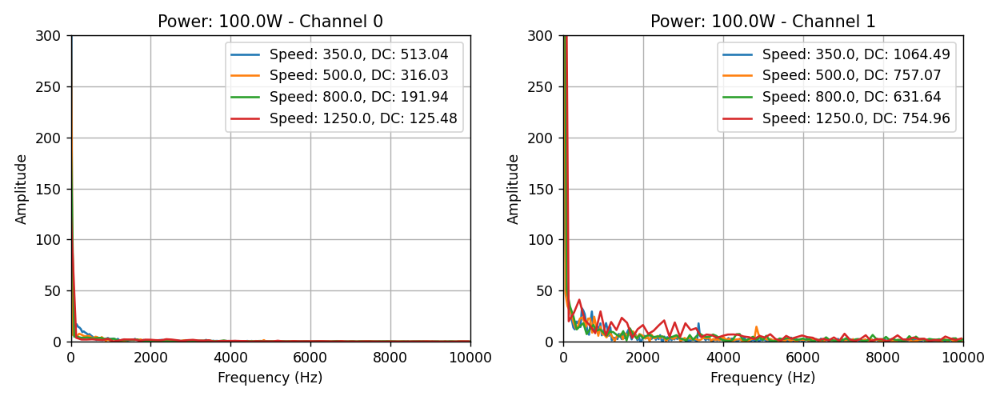

<IPython.core.display.Javascript object>


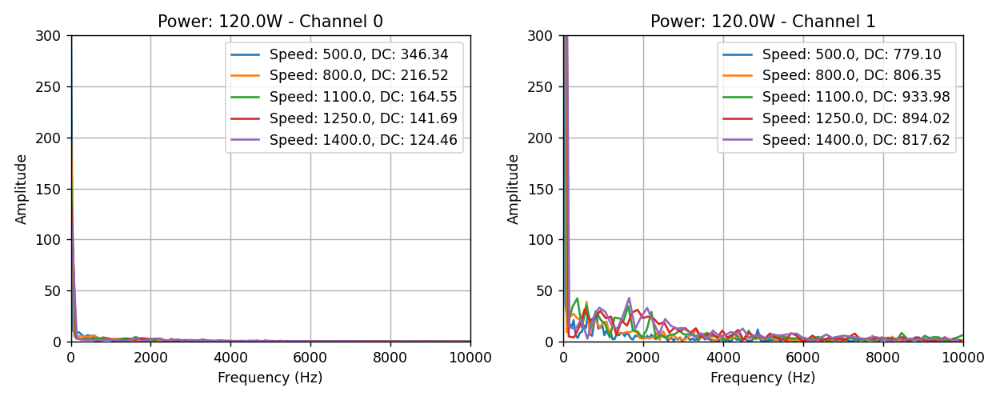

<IPython.core.display.Javascript object>


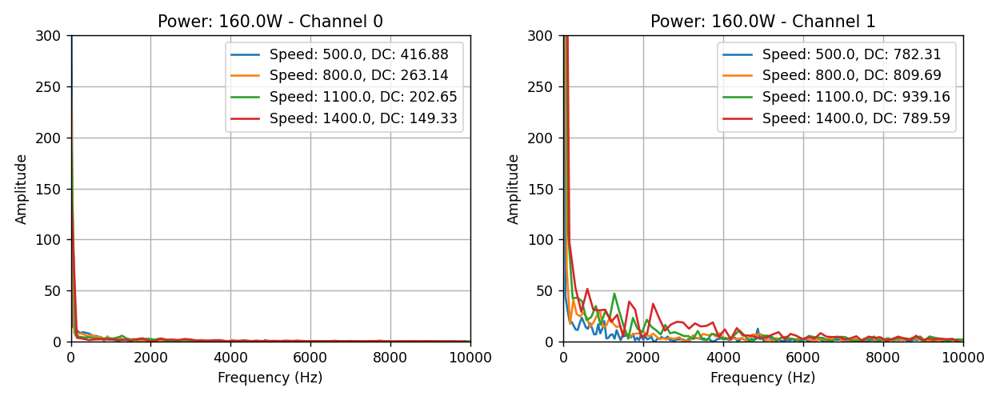

<IPython.core.display.Javascript object>


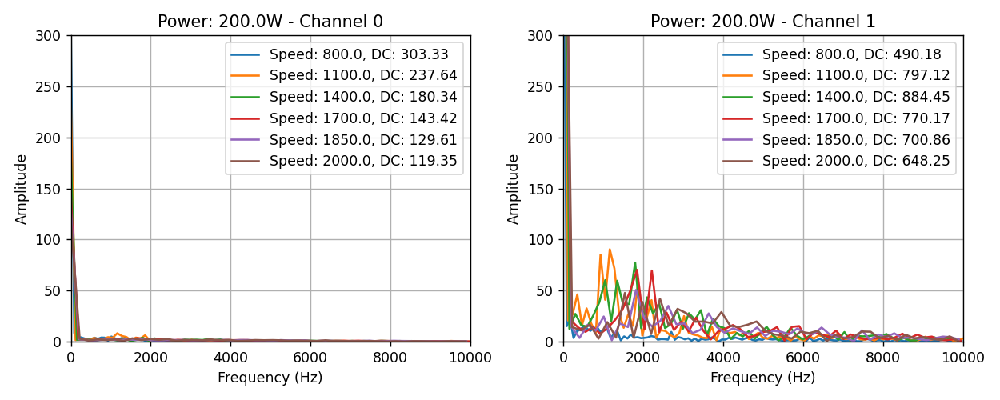

<IPython.core.display.Javascript object>


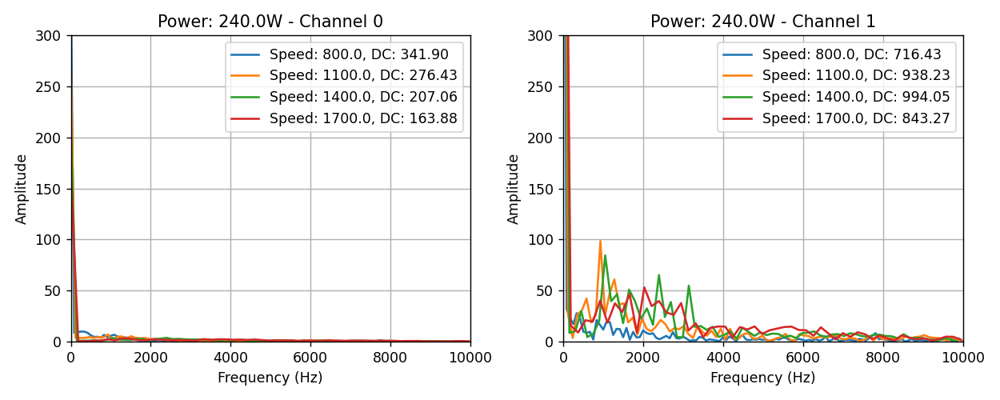

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft

import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
import os

# Ensure the 'Figures' folder exists
if not os.path.exists('./Figures'):
    os.makedirs('./Figures')

# Sampling frequency
fs = 100000  # in Hz

# Frequency limit
freq_limit = 10000  # 10 kHz

# Extract unique power levels
unique_powers = set()
for condition_number in range(len(final_data_list)):
    condition_info = get_condition_info(condition_number + 1, df_conditions)
    unique_powers.add(condition_info['Power'])
unique_powers = sorted(list(unique_powers))

# Loop through all unique power levels
for power in unique_powers:
    plt.figure(figsize=(10, 4))

    # Separate subplots for each channel
    for channel in range(2):
        plt.subplot(1, 2, channel + 1)

        # Loop through all conditions
        for condition_number in range(len(final_data_list)):
            condition_info = get_condition_info(condition_number + 1, df_conditions)
            
            # Check if the condition matches the current power level
            if condition_info['Power'] == power:
                condition_data = final_data_list[condition_number]
                
                # Average the last 18 segments for the current channel
                avg_data = np.mean(condition_data[channel][2:, :], axis=0)
                
                # Perform FFT
                fft_values = fft(avg_data)
                freqs = np.fft.fftfreq(len(fft_values), 1/fs)
                
                # Capture the DC value (FFT at bin 0)
                dc_value = np.abs(fft_values[0])
                
                # Filter frequencies to be below 10 kHz
                positive_freqs = freqs[:len(freqs)//2]
                valid_indices = np.where(positive_freqs <= freq_limit)[0]
                
                # Plot the FFT, considering only the positive frequencies and up to 10 kHz
                plt.plot(positive_freqs[valid_indices], np.abs(fft_values)[:len(freqs)//2][valid_indices], label=f"Speed: {condition_info['Speed']}, DC: {dc_value:.2f}")

        plt.title(f"Power: {power}W - Channel {channel}")
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Amplitude")
        plt.xlim([0, freq_limit])
        plt.ylim([0, 300])
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    
    # Save the plot
    plt.savefig(f'./Figures/Power_{power}W.png', dpi=600)
    
    plt.show()


<IPython.core.display.Javascript object>


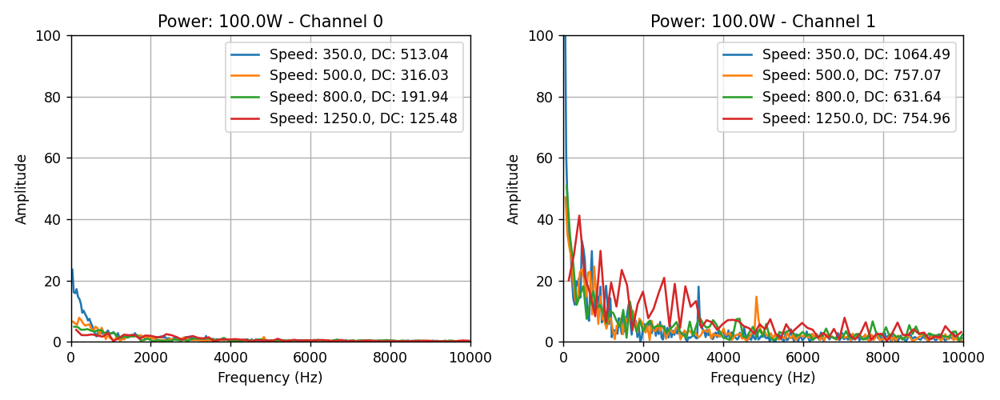

<IPython.core.display.Javascript object>


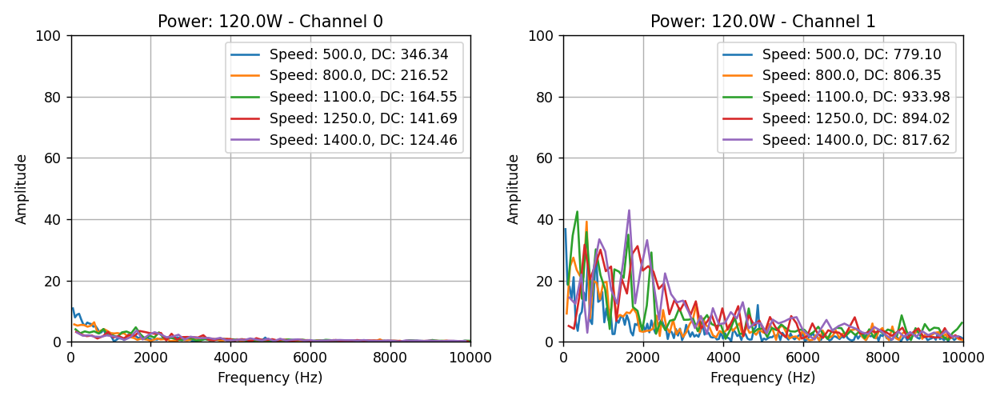

<IPython.core.display.Javascript object>


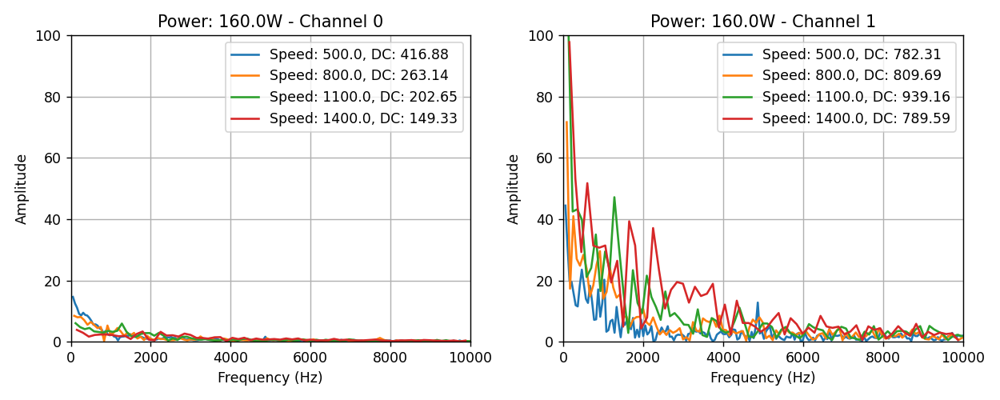

<IPython.core.display.Javascript object>


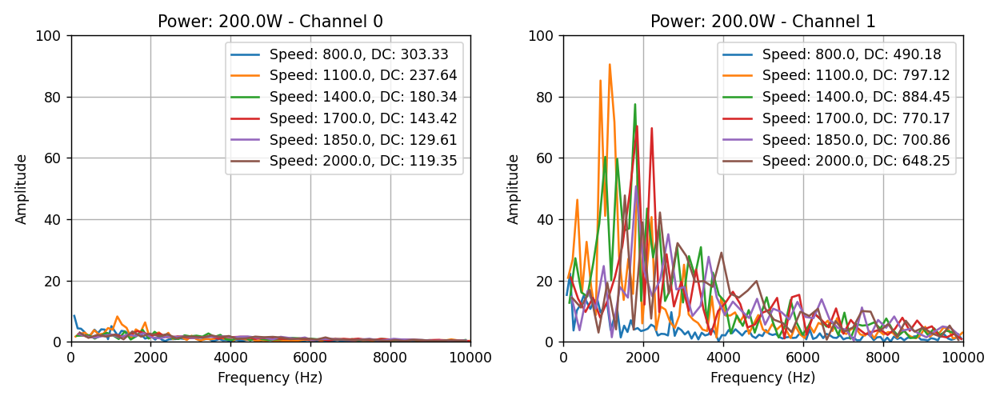

<IPython.core.display.Javascript object>


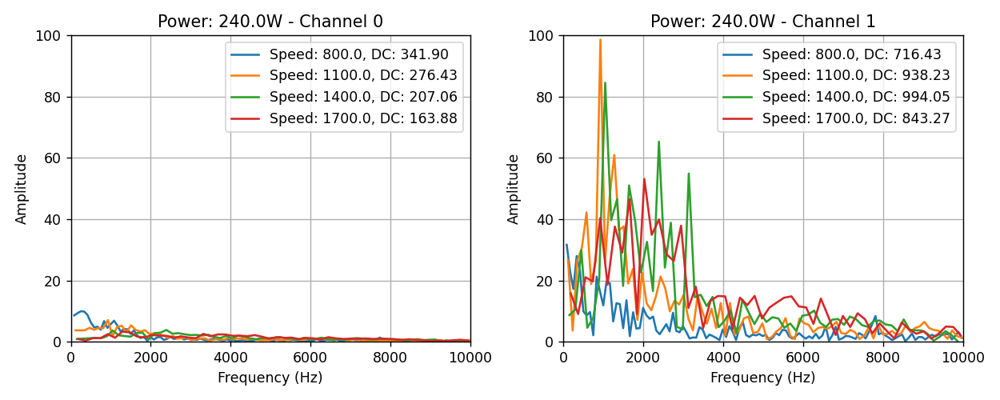

In [7]:
# Sampling frequency
fs = 100000  # in Hz

# Frequency limit
freq_limit = 10000  # 10 kHz

# Extract unique power levels
unique_powers = set()
for condition_number in range(len(final_data_list)):
    condition_info = get_condition_info(condition_number + 1, df_conditions)
    unique_powers.add(condition_info['Power'])
unique_powers = sorted(list(unique_powers))

# Loop through all unique power levels
for power in unique_powers:
    plt.figure(figsize=(10, 4))

    # Separate subplots for each channel
    for channel in range(2):
        plt.subplot(1, 2, channel + 1)

        # Loop through all conditions
        for condition_number in range(len(final_data_list)):
            condition_info = get_condition_info(condition_number + 1, df_conditions)
            
            # Check if the condition matches the current power level
            if condition_info['Power'] == power:
                condition_data = final_data_list[condition_number]
                
                # Average the last 18 segments for the current channel
                avg_data = np.mean(condition_data[channel][2:, :], axis=0)
                
                # Perform FFT
                fft_values = fft(avg_data)
                freqs = np.fft.fftfreq(len(fft_values), 1/fs)
                
                # Capture the DC value (FFT at bin 0)
                dc_value = np.abs(fft_values[0])
                
                # Filter frequencies to be below 10 kHz and exclude 0 Hz
                positive_freqs = freqs[:len(freqs)//2]
                valid_indices = np.where((positive_freqs <= freq_limit) & (positive_freqs > 0))[0]
                
                # Plot the FFT, considering only the positive frequencies and up to 10 kHz, excluding 0 Hz
                plt.plot(positive_freqs[valid_indices], np.abs(fft_values)[:len(freqs)//2][valid_indices], label=f"Speed: {condition_info['Speed']}, DC: {dc_value:.2f}")

        plt.title(f"Power: {power}W - Channel {channel}")
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Amplitude")
        plt.xlim([0, freq_limit])
        plt.ylim([0, 100])
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    
    # Save the plot
    plt.savefig(f'./Figures/FFT_Power_{power}W_noDC.png', dpi=600)
    
    plt.show()


<IPython.core.display.Javascript object>


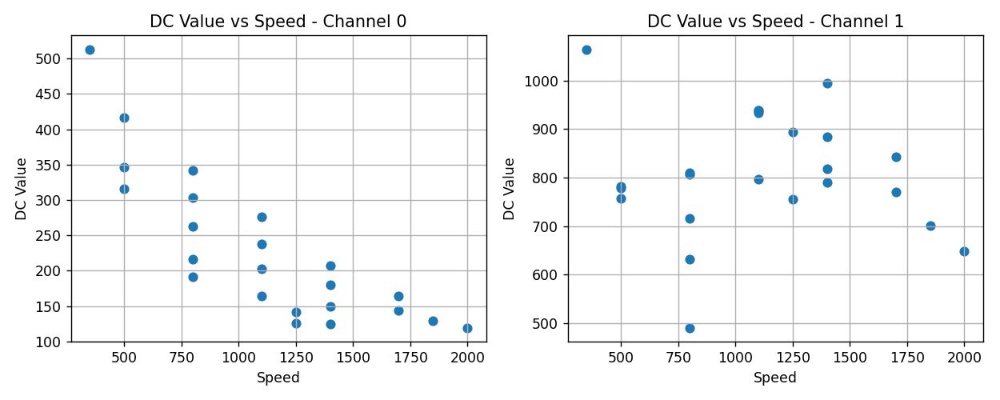

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft

# Initialize lists to hold DC values and speeds for each channel
dc_values = {'channel_0': [], 'channel_1': []}
speeds = {'channel_0': [], 'channel_1': []}

# Loop through all conditions
for condition_number in range(len(final_data_list)):
    condition_info = get_condition_info(condition_number + 1, df_conditions)
    
    # Extract speed and power for this condition
    speed = condition_info['Speed']
    condition_data = final_data_list[condition_number]
    
    # Loop through each channel
    for channel in range(2):
        # Average the last 18 segments for the current channel
        avg_data = np.mean(condition_data[channel][2:, :], axis=0)
        
        # Perform FFT and capture the DC value
        fft_values = fft(avg_data)
        dc_value = np.abs(fft_values[0])
        
        # Store the DC value and speed
        channel_key = f'channel_{channel}'
        dc_values[channel_key].append(dc_value)
        speeds[channel_key].append(speed)

# Create the plots
plt.figure(figsize=(10, 4))

for channel in range(2):
    plt.subplot(1, 2, channel + 1)
    
    channel_key = f'channel_{channel}'
    
    plt.scatter(speeds[channel_key], dc_values[channel_key], label=f"Channel {channel}")
    plt.title(f"DC Value vs Speed - Channel {channel}")
    plt.xlabel("Speed")
    plt.ylabel("DC Value")
    plt.grid(True)

plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>


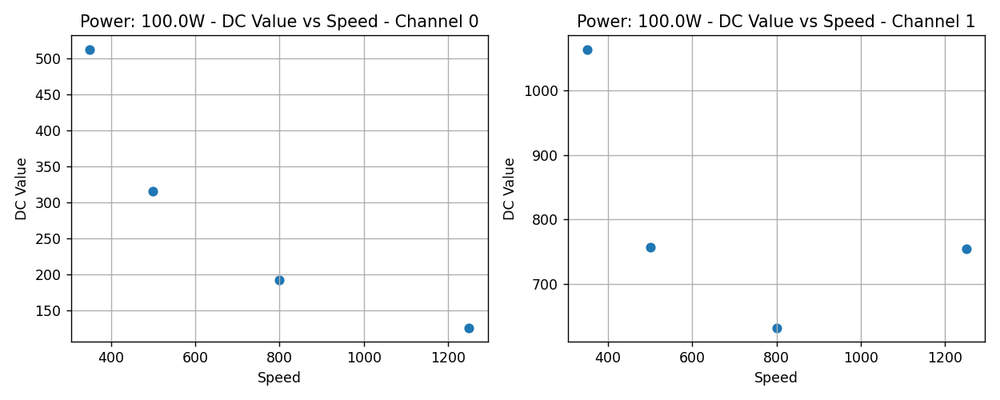

<IPython.core.display.Javascript object>


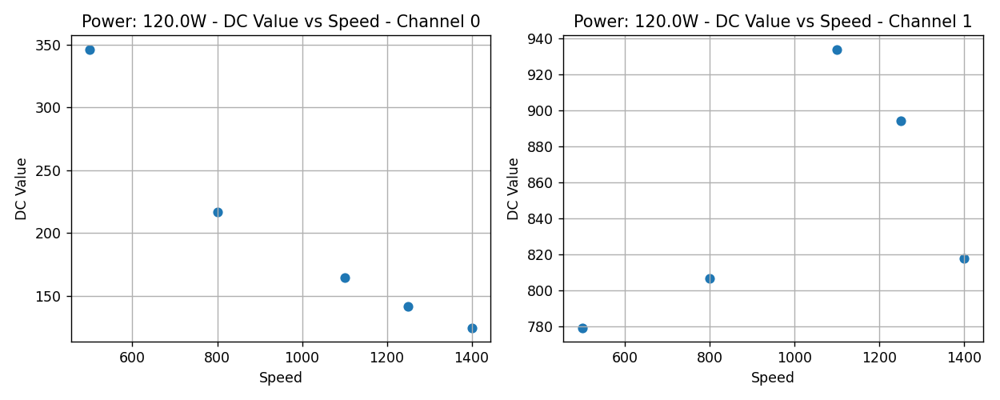

<IPython.core.display.Javascript object>


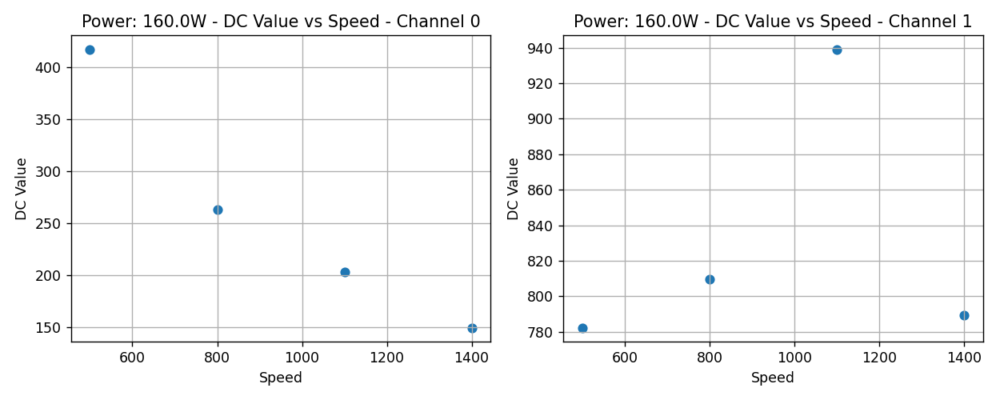

<IPython.core.display.Javascript object>


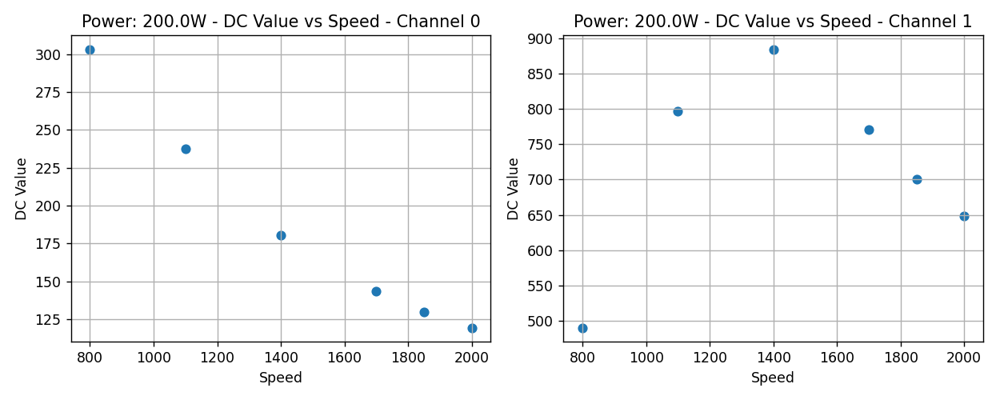

<IPython.core.display.Javascript object>


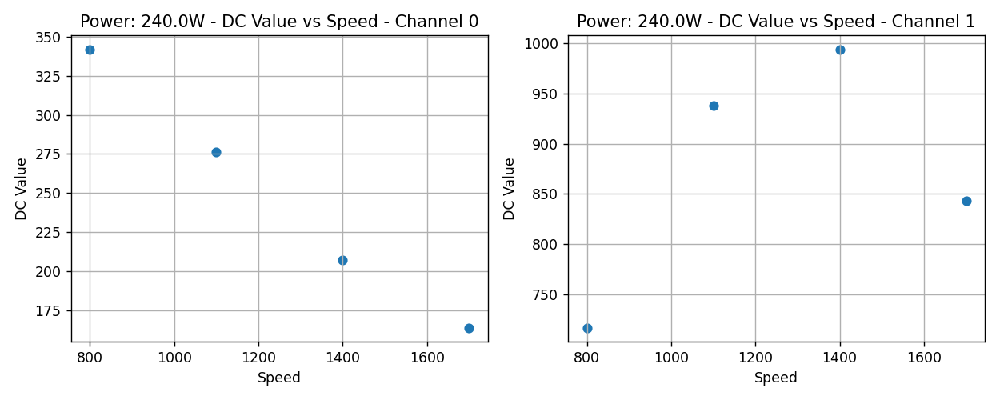

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
import os

# Ensure the 'Figures' folder exists
if not os.path.exists('./Figures'):
    os.makedirs('./Figures')

# Extract unique power levels
unique_powers = set()
for condition_number in range(len(final_data_list)):
    condition_info = get_condition_info(condition_number + 1, df_conditions)
    unique_powers.add(condition_info['Power'])
unique_powers = sorted(list(unique_powers))

# Loop through all unique power levels
for power in unique_powers:
    plt.figure(figsize=(10, 4))

    # Separate subplots for each channel
    for channel in range(2):
        plt.subplot(1, 2, channel + 1)

        dc_values = []
        speed_values = []

        # Loop through all conditions
        for condition_number in range(len(final_data_list)):
            condition_info = get_condition_info(condition_number + 1, df_conditions)

            # Check if the condition matches the current power level
            if condition_info['Power'] == power:
                condition_data = final_data_list[condition_number]

                # Average the last 18 segments for the current channel
                avg_data = np.mean(condition_data[channel][2:, :], axis=0)

                # Perform FFT and capture the DC value
                fft_values = fft(avg_data)
                dc_value = np.abs(fft_values[0])

                dc_values.append(dc_value)
                speed_values.append(condition_info['Speed'])

        plt.scatter(speed_values, dc_values, label=f"Channel {channel}")
        plt.title(f"Power: {power}W - DC Value vs Speed - Channel {channel}")
        plt.xlabel("Speed")
        plt.ylabel("DC Value")
        plt.grid(True)

    plt.tight_layout()

    # Save the plot
    plt.savefig(f'./Figures/DC_vs_Speed_Power_{power}W.png', dpi=600)

    plt.show()


/tmp/ipykernel_2276002/3901572874.py:48: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  peak_speed = speeds[peaks[-1]] if peaks else speeds[-1]


<IPython.core.display.Javascript object>


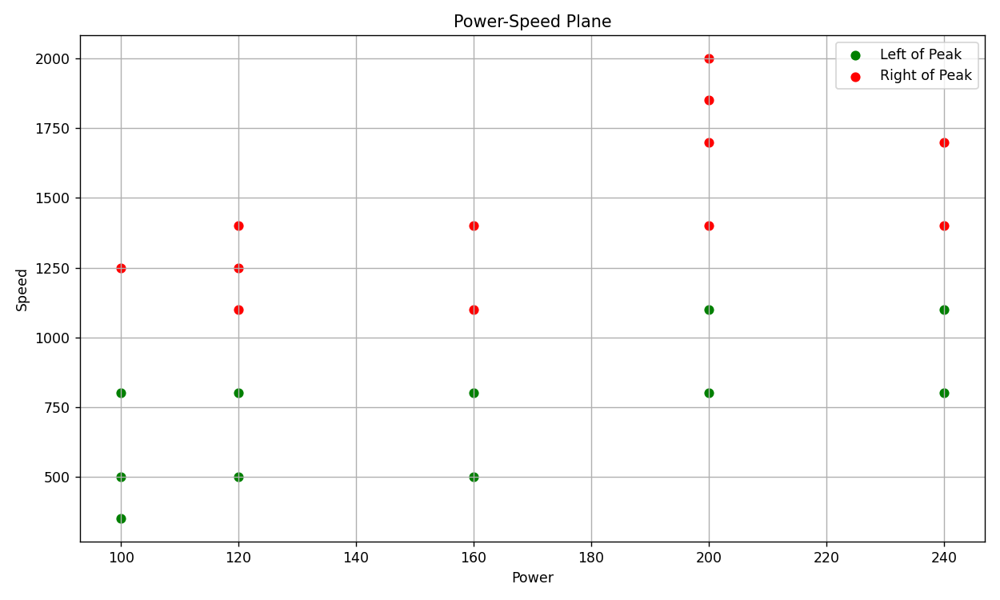

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
from scipy.signal import find_peaks
import os

# Ensure the 'Figures' folder exists
if not os.path.exists('./Figures'):
    os.makedirs('./Figures')

# Initialize Data Structures
peak_speeds = {}  # To hold the peak speed for each power level
left_of_peak = {'power': [], 'speed': []}
right_of_peak = {'power': [], 'speed': []}

# DC Value vs Speed Analysis and Peak Identification
unique_powers = set([get_condition_info(i + 1, df_conditions)['Power'] for i in range(len(final_data_list))])
unique_powers = sorted(list(unique_powers))

for power in unique_powers:
    dc_speed_list = []  # To hold (dc_value, speed) pairs for each power level

    # Loop through all conditions
    for condition_number in range(len(final_data_list)):
        condition_info = get_condition_info(condition_number + 1, df_conditions)

        # Check if the condition matches the current power level
        if condition_info['Power'] == power:
            condition_data = final_data_list[condition_number]

            # Average the last 18 segments for channel 1
            avg_data = np.mean(condition_data[1][2:, :], axis=0)

            # Perform FFT and capture the DC value
            fft_values = fft(avg_data)
            dc_value = np.abs(fft_values[0])

            dc_speed_list.append((dc_value, condition_info['Speed']))

    # Sort the list based on speed
    dc_speed_list.sort(key=lambda x: x[1])

    # Extract DC values and speeds into separate lists
    dc_values, speeds = zip(*dc_speed_list)

    # Identify the peak speed
    peaks, _ = find_peaks(dc_values)
    peak_speed = speeds[peaks[-1]] if peaks else speeds[-1]
    peak_speeds[power] = peak_speed

    # Categorize speeds as left or right of peak
    for s in speeds:
        if s < peak_speed:
            left_of_peak['power'].append(power)
            left_of_peak['speed'].append(s)
        else:
            right_of_peak['power'].append(power)
            right_of_peak['speed'].append(s)

# Power-Speed Scatter Plot
plt.figure(figsize=(10, 6))
plt.scatter(left_of_peak['power'], left_of_peak['speed'], c='g', label='Left of Peak')
plt.scatter(right_of_peak['power'], right_of_peak['speed'], c='r', label='Right of Peak')
plt.title("Power-Speed Plane")
plt.xlabel("Power")
plt.ylabel("Speed")
plt.legend()
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('./Figures/Power_Speed_Plane.png')
plt.show()


In [11]:
# Initialize an empty dictionary to store the moments for each condition
moments_dict = {}

# Loop over all conditions
for condition_number in range(len(final_data_list)):
    # Get information for the current condition (adding 1 to the condition number)
    condition_info = get_condition_info(condition_number + 1, df_conditions)

    # Extract the data for the current condition
    condition_data = final_data_list[condition_number]

    # Initialize a dictionary to hold the moments for this condition
    condition_moments = {'info': condition_info, 'channel_0': {}, 'channel_1': {}}

    # Compute the first 5 statistical moments for each channel
    for channel in range(2):
        # Average the segments for the current channel
        avg_data = np.mean(condition_data[channel][2:,:], axis=0)

        # Compute the first 5 moments: mean, variance, skewness, kurtosis, 5th moment
        moments = [np.mean(avg_data), np.var(avg_data)]
        moments.extend([moment(avg_data, moment=i) for i in range(3, 6)])

        # Add the moments to the dictionary
        channel_key = f'channel_{channel}'
        condition_moments[channel_key]['moments'] = moments

    # Add this condition's moments to the main dictionary
    moments_dict[condition_number + 1] = condition_moments


In [12]:
moments_dict

{1: {'info': {'Condition': 1.0,
   'Power': 100.0,
   'Speed': 350.0,
   'Norm Enthalpy': 43.23,
   'Hatch Spacing': 60.2},
  'channel_0': {'moments': [0.18277252428987056,
    0.000691936510387713,
    -4.482105855850561e-05,
    5.246187702658068e-06,
    -5.442869444372478e-07]},
  'channel_1': {'moments': [0.37922744616494475,
    0.008543418228508567,
    -0.0009072962138624652,
    0.0003311103801014947,
    -7.373497426870626e-05]}},
 2: {'info': {'Condition': 2.0,
   'Power': 100.0,
   'Speed': 500.0,
   'Norm Enthalpy': 36.17,
   'Hatch Spacing': 51.6},
  'channel_0': {'moments': [0.16248442086575263,
    0.00028579885350420083,
    -1.6837884310091857e-05,
    1.3930829173083946e-06,
    -1.1372734140571282e-07]},
  'channel_1': {'moments': [0.38924090002370754,
    0.006389303609426493,
    -0.0007125732245656411,
    0.00028195718202536234,
    -6.609498276276874e-05]}},
 3: {'info': {'Condition': 3.0,
   'Power': 100.0,
   'Speed': 800.0,
   'Norm Enthalpy': 28.59,
   'Hat

In [13]:
# import numpy as np

# # Initialize dictionaries to store mean and std for each channel and moment
# means = {0: {}, 1: {}}
# stds = {0: {}, 1: {}}

# # Calculate the mean and std for each moment and channel
# for channel in [0, 1]:
#     channel_key = f'channel_{channel}'
#     for moment_index in range(5):  # Looping over 5 moments
#         moment_values = [moments_dict[cond][channel_key]['moments'][moment_index] for cond in moments_dict.keys()]
#         means[channel][moment_index] = np.mean(moment_values)
#         stds[channel][moment_index] = np.std(moment_values)

# # Perform the standardization
# for channel in [0, 1]:
#     channel_key = f'channel_{channel}'
#     for condition in moments_dict.keys():
#         for moment_index in range(5):  # Looping over 5 moments
#             x = moments_dict[condition][channel_key]['moments'][moment_index]
#             mean = means[channel][moment_index]
#             std = stds[channel][moment_index]
            
#             moments_dict[condition][channel_key]['moments'][moment_index] = (x - mean) / std


<IPython.core.display.Javascript object>


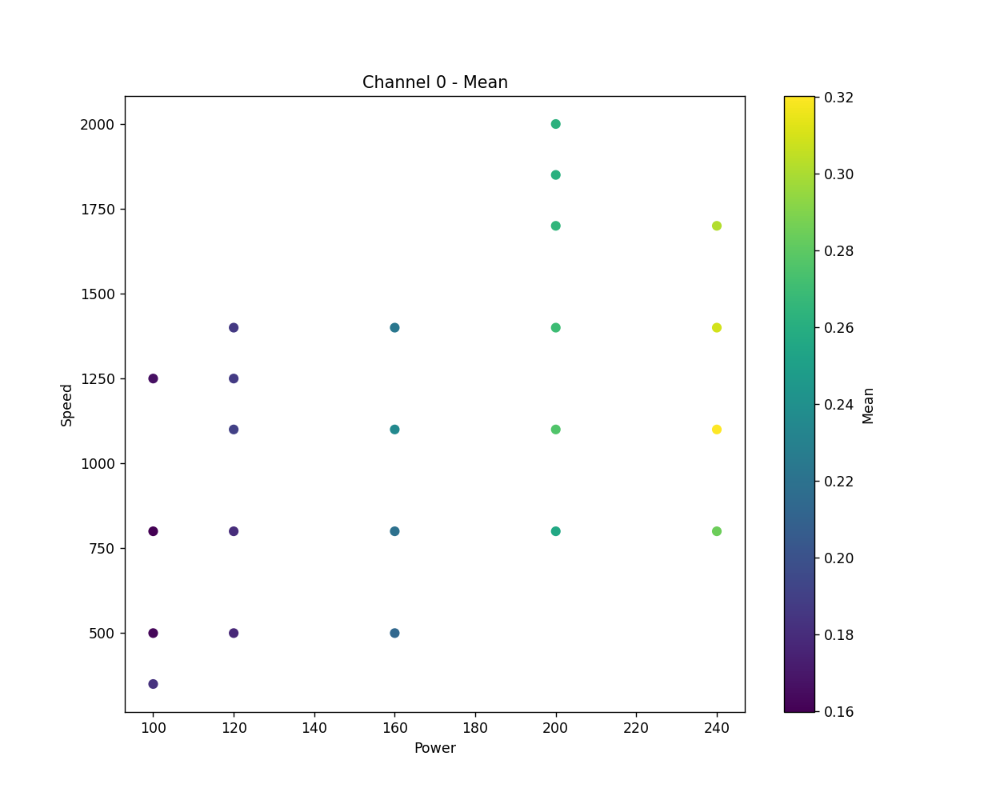

<IPython.core.display.Javascript object>


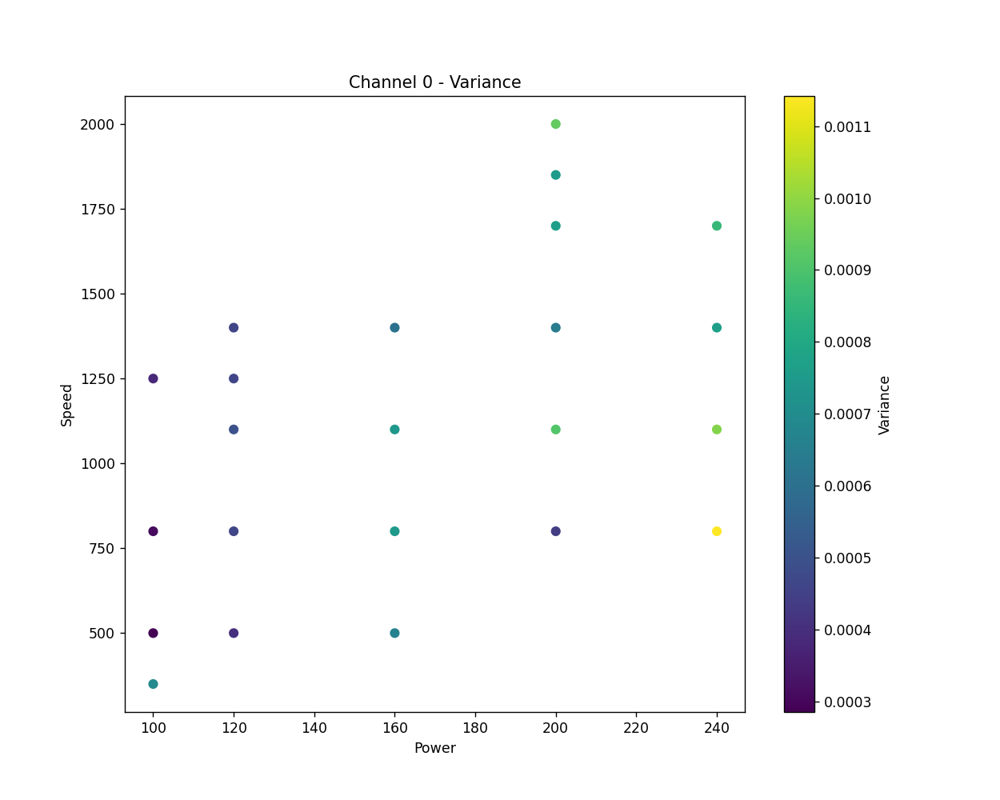

<IPython.core.display.Javascript object>


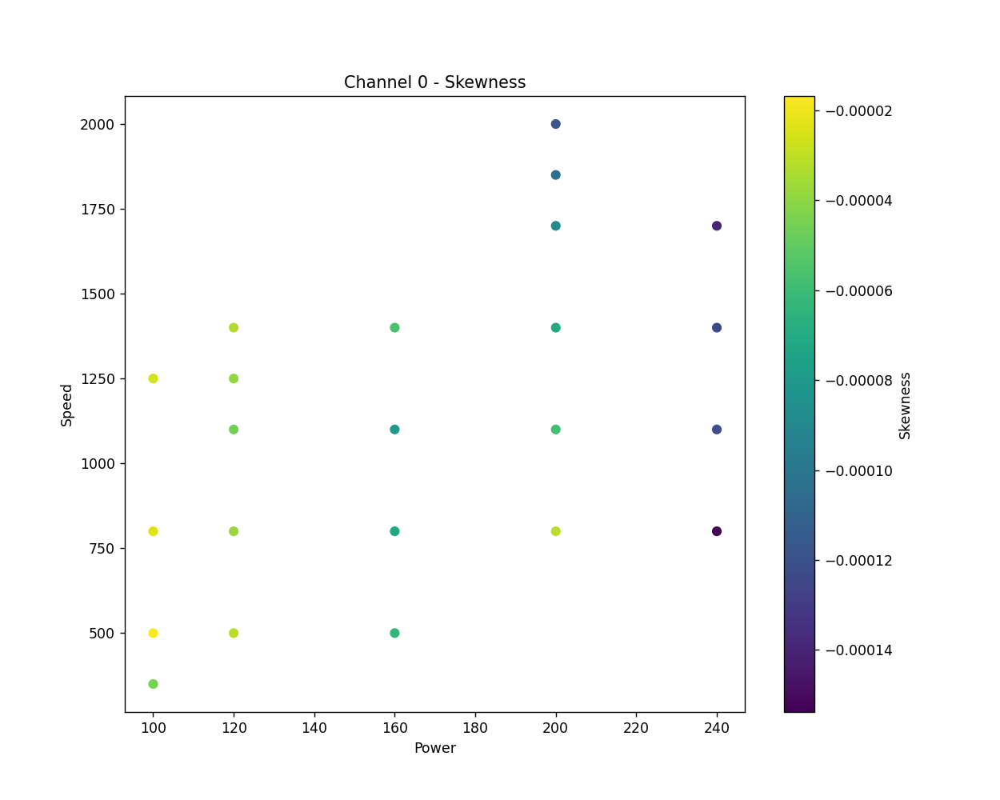

/tmp/ipykernel_2276002/2852293968.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10, 8))


<IPython.core.display.Javascript object>


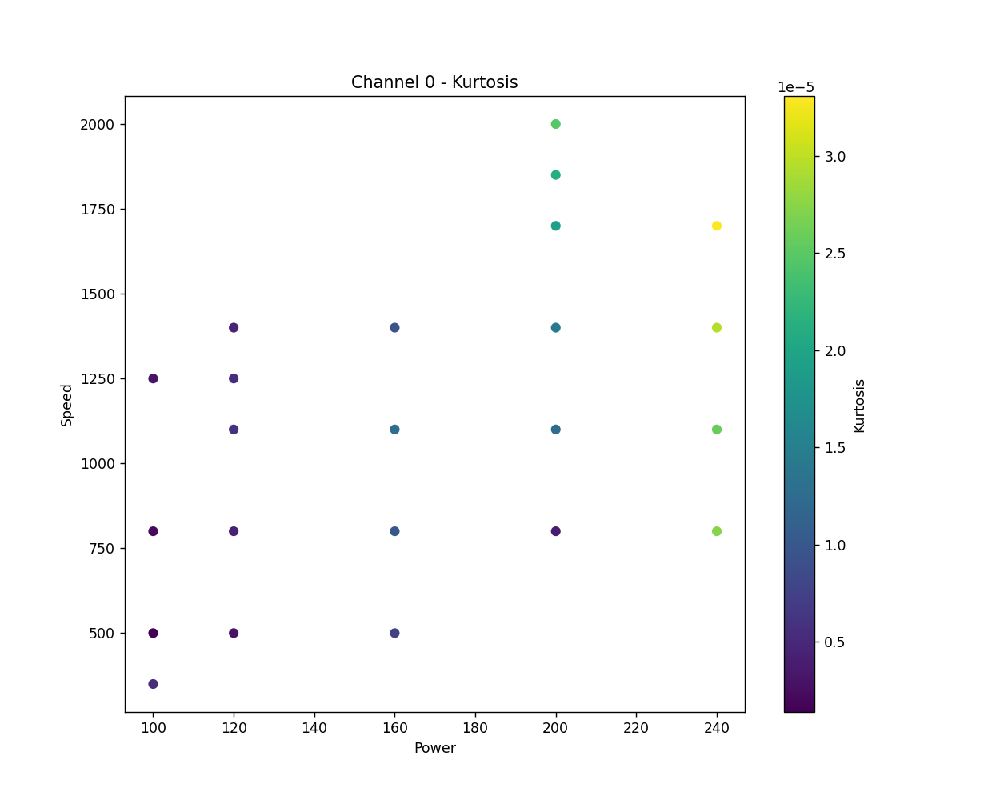

<IPython.core.display.Javascript object>


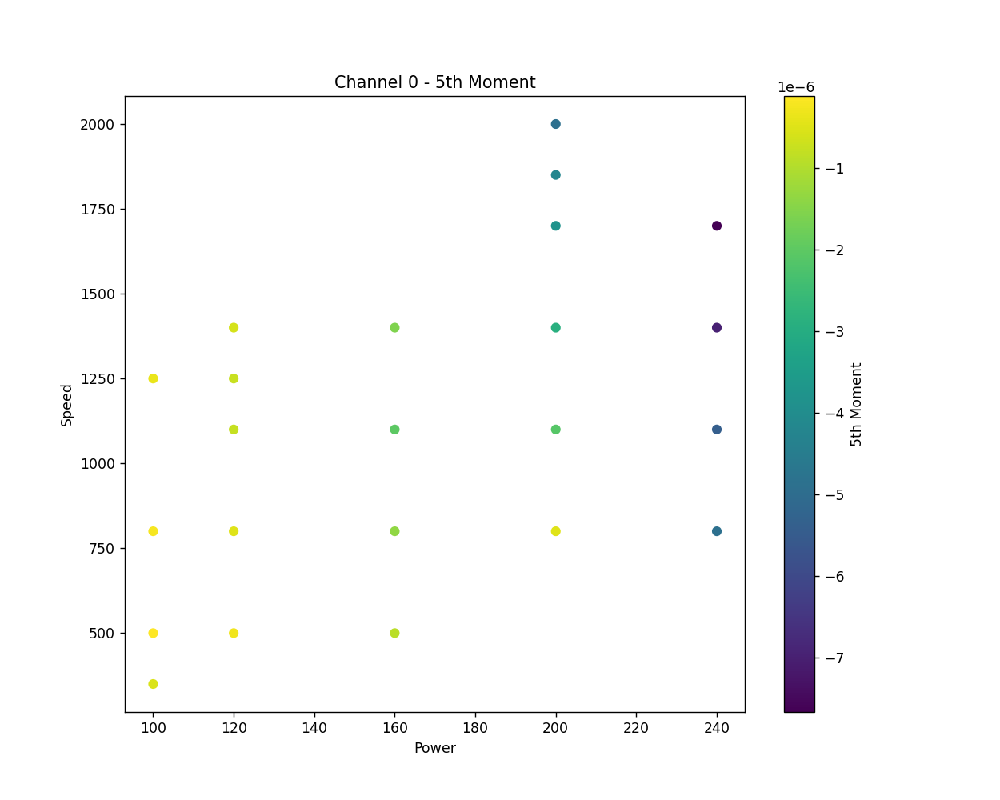

<IPython.core.display.Javascript object>


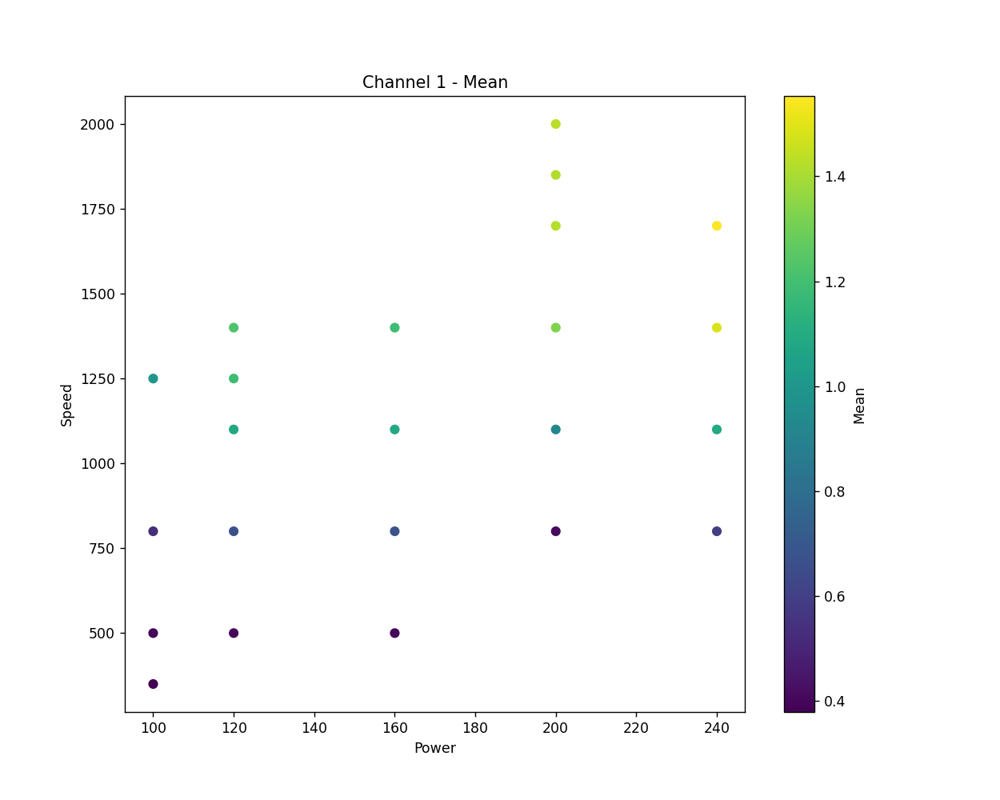

<IPython.core.display.Javascript object>


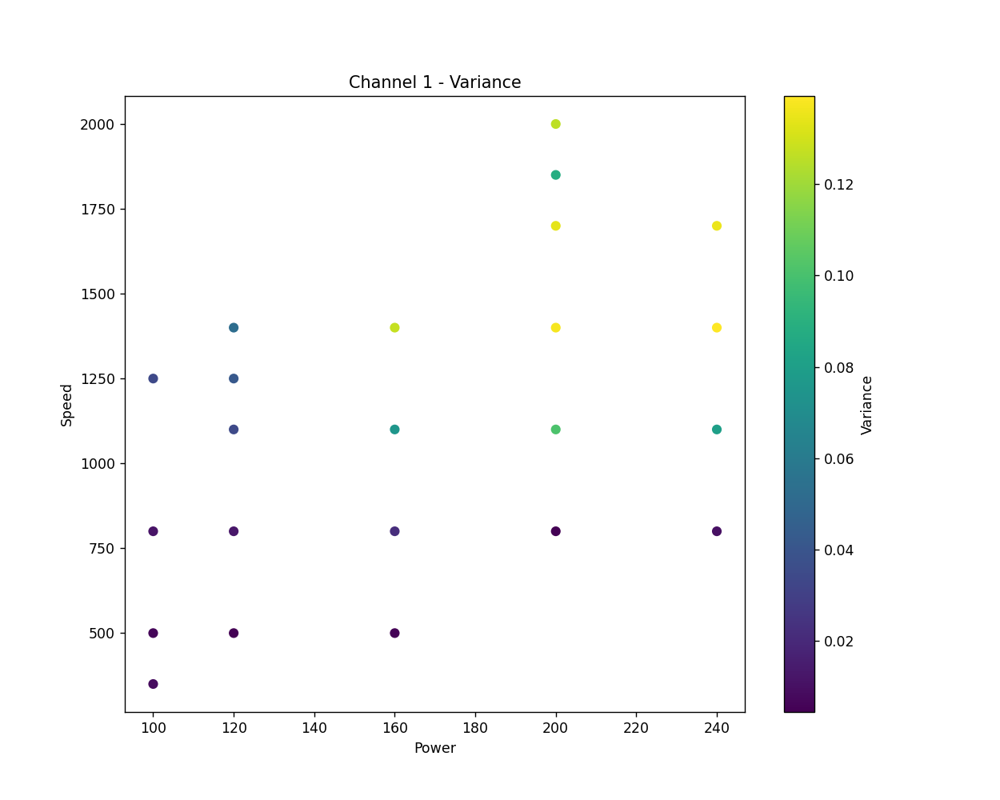

<IPython.core.display.Javascript object>


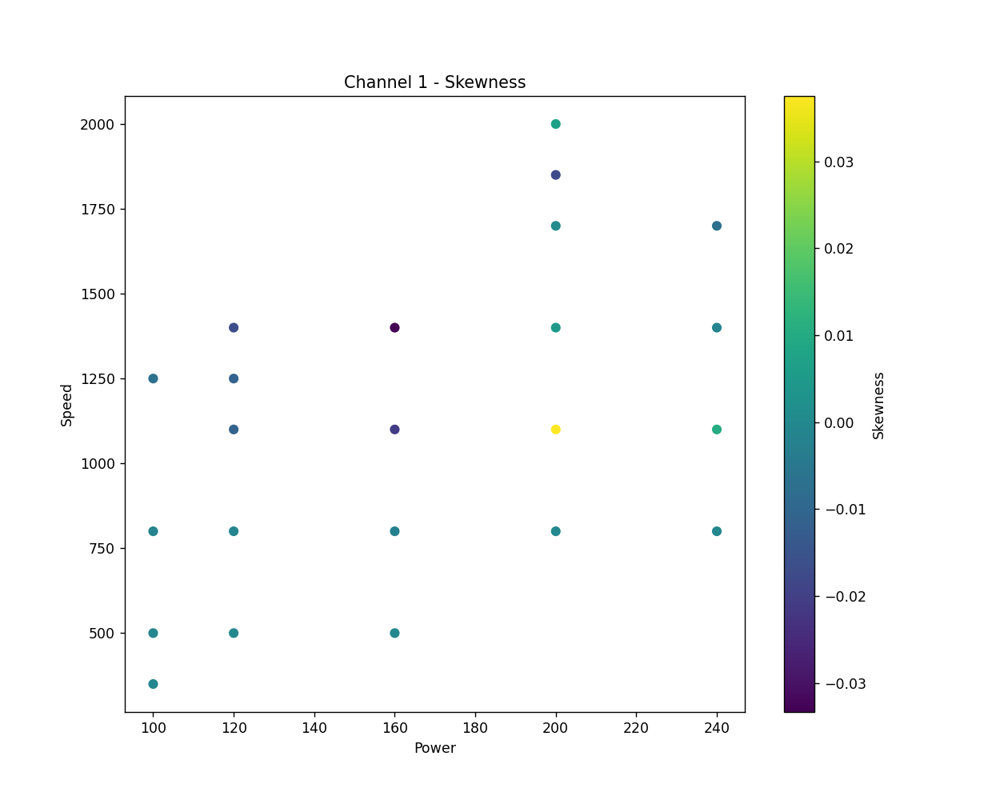

<IPython.core.display.Javascript object>


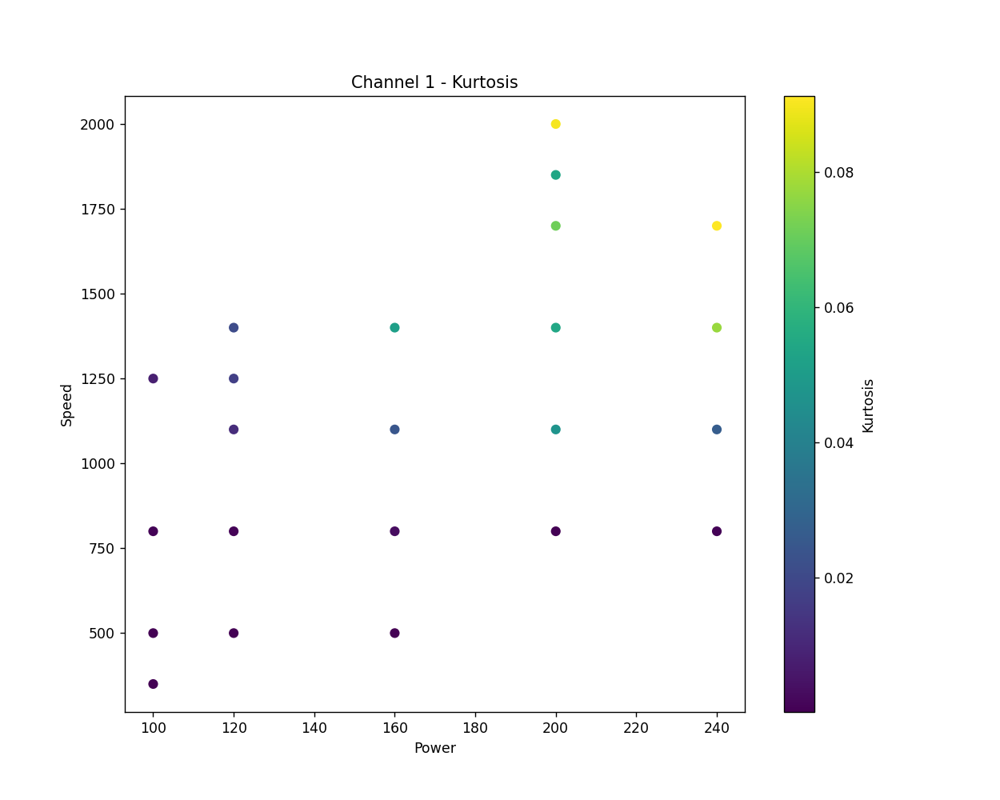

<IPython.core.display.Javascript object>


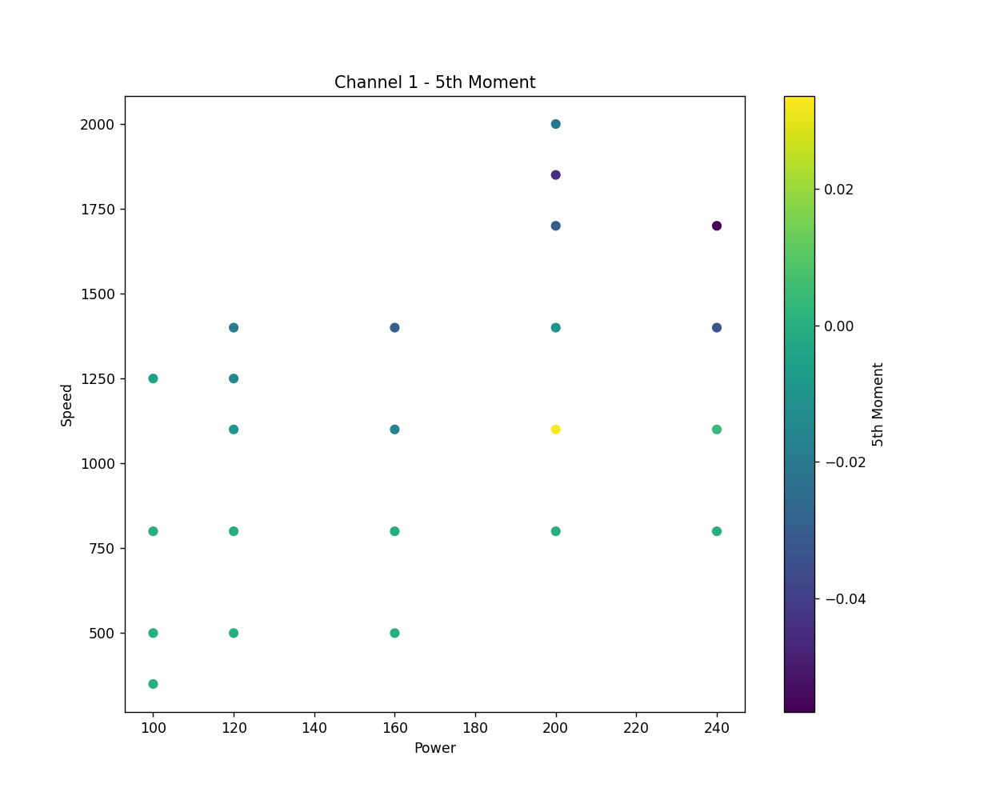

In [14]:
import matplotlib.pyplot as plt

# Initialize the names of the moments for labeling
moment_names = ['Mean', 'Variance', 'Skewness', 'Kurtosis', '5th Moment']

# Loop through each channel
for channel in range(2):
    channel_key = f'channel_{channel}'
    
    # Initialize the data for the scatter plots
    power = []
    speed = []
    moments = [[] for _ in range(5)]
    
    # Gather the data for the scatter plots
    for condition_number, condition_data in moments_dict.items():
        power.append(condition_data['info']['Power'])
        speed.append(condition_data['info']['Speed'])
        
        for i in range(5):
            moments[i].append(condition_data[channel_key]['moments'][i])
            
    # Create the 5 scatter plots for each moment
    for i, moment_name in enumerate(moment_names):
        plt.figure(figsize=(10, 8))
        plt.scatter(power, speed, c=moments[i], cmap='viridis')
        plt.colorbar(label=f'{moment_name}')
        plt.xlabel('Power')
        plt.ylabel('Speed')
        plt.title(f'Channel {channel} - {moment_name}')
        plt.show()


In [15]:
moments_dict.values()

dict_values([{'info': {'Condition': 1.0, 'Power': 100.0, 'Speed': 350.0, 'Norm Enthalpy': 43.23, 'Hatch Spacing': 60.2}, 'channel_0': {'moments': [0.18277252428987056, 0.000691936510387713, -4.482105855850561e-05, 5.246187702658068e-06, -5.442869444372478e-07]}, 'channel_1': {'moments': [0.37922744616494475, 0.008543418228508567, -0.0009072962138624652, 0.0003311103801014947, -7.373497426870626e-05]}}, {'info': {'Condition': 2.0, 'Power': 100.0, 'Speed': 500.0, 'Norm Enthalpy': 36.17, 'Hatch Spacing': 51.6}, 'channel_0': {'moments': [0.16248442086575263, 0.00028579885350420083, -1.6837884310091857e-05, 1.3930829173083946e-06, -1.1372734140571282e-07]}, 'channel_1': {'moments': [0.38924090002370754, 0.006389303609426493, -0.0007125732245656411, 0.00028195718202536234, -6.609498276276874e-05]}}, {'info': {'Condition': 3.0, 'Power': 100.0, 'Speed': 800.0, 'Norm Enthalpy': 28.59, 'Hatch Spacing': 41.5}, 'channel_0': {'moments': [0.15981481657738922, 0.0003123009913967486, -2.33285836559359

<IPython.core.display.Javascript object>


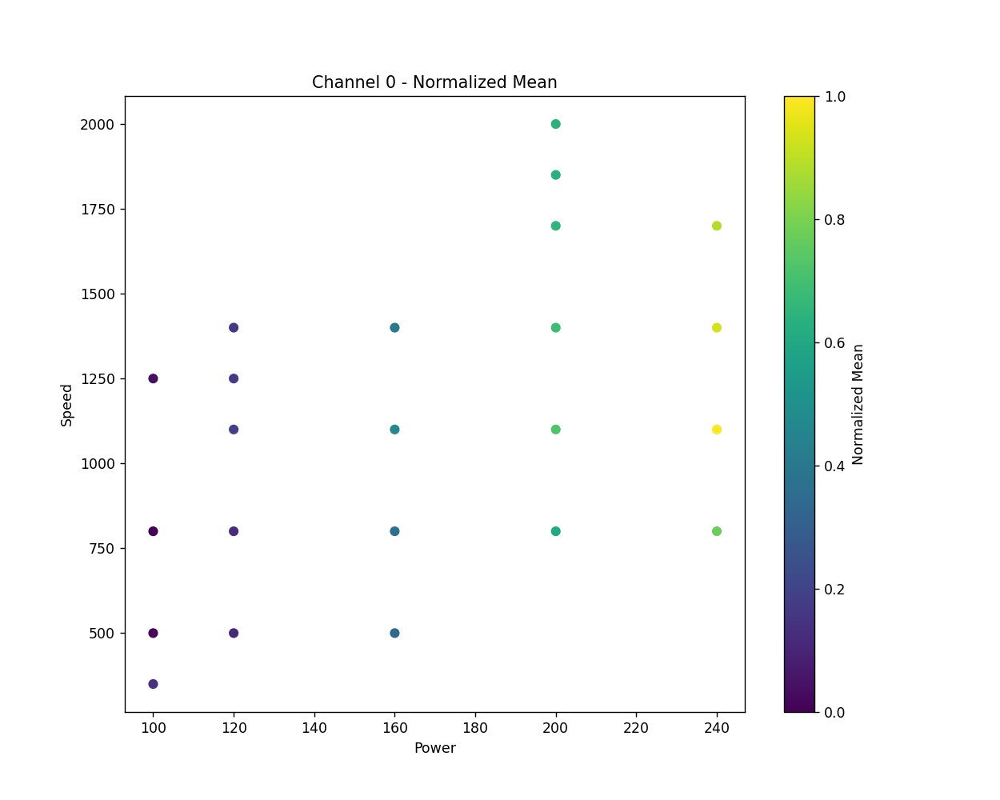

<IPython.core.display.Javascript object>


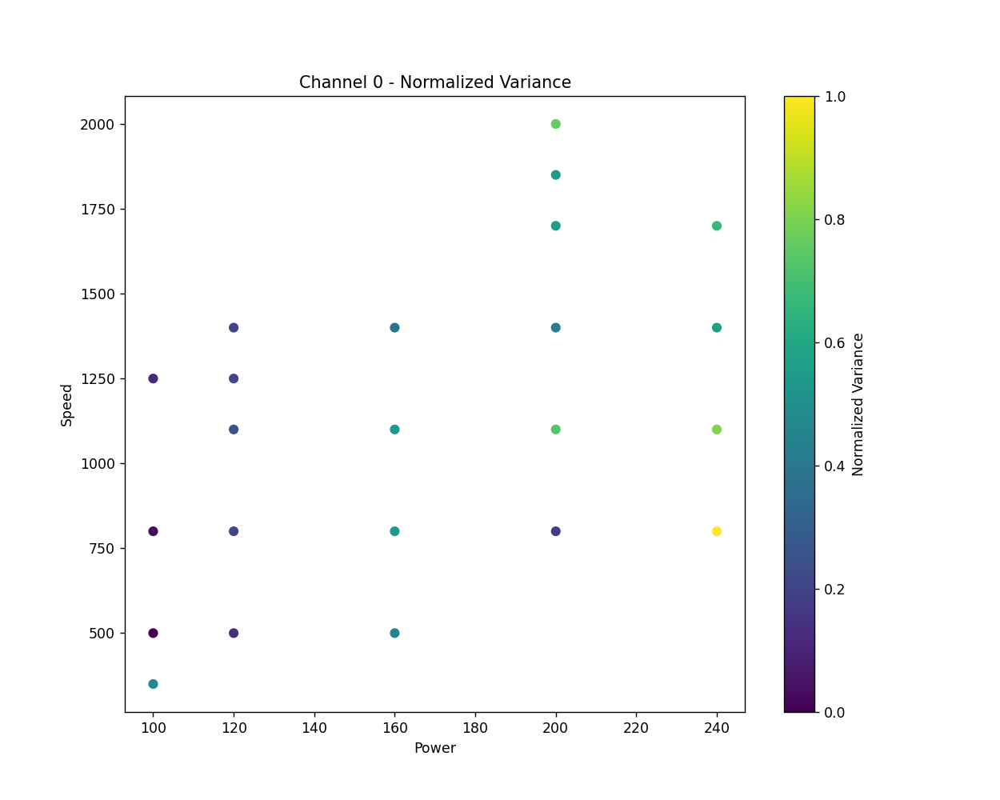

<IPython.core.display.Javascript object>


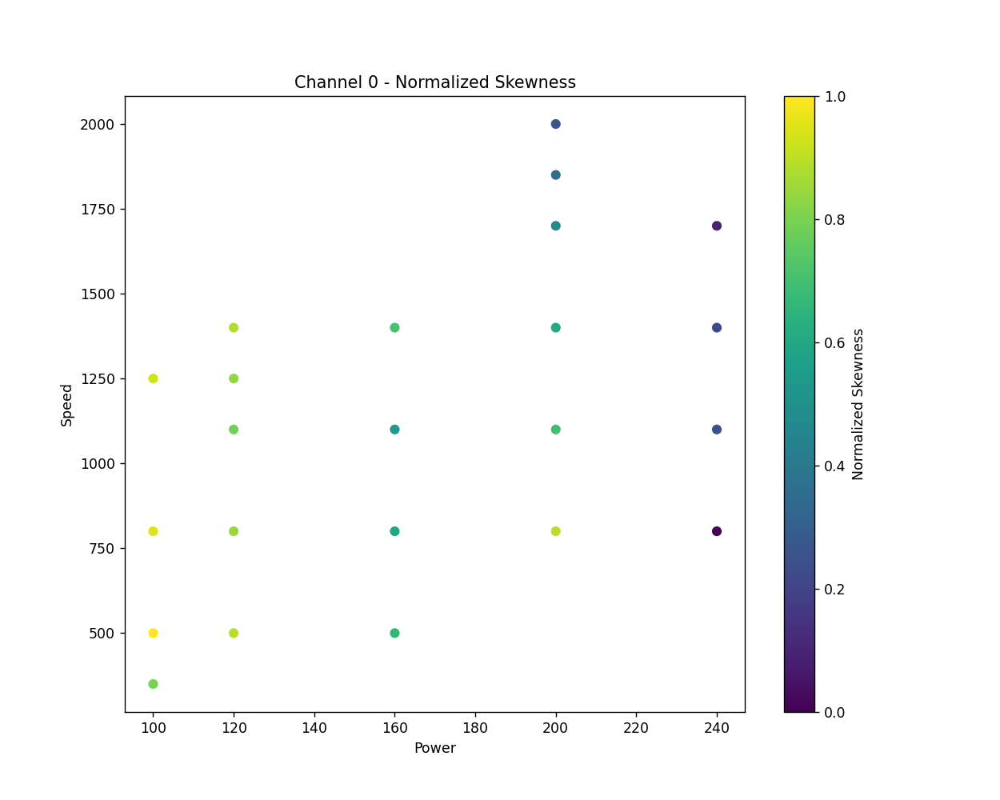

<IPython.core.display.Javascript object>


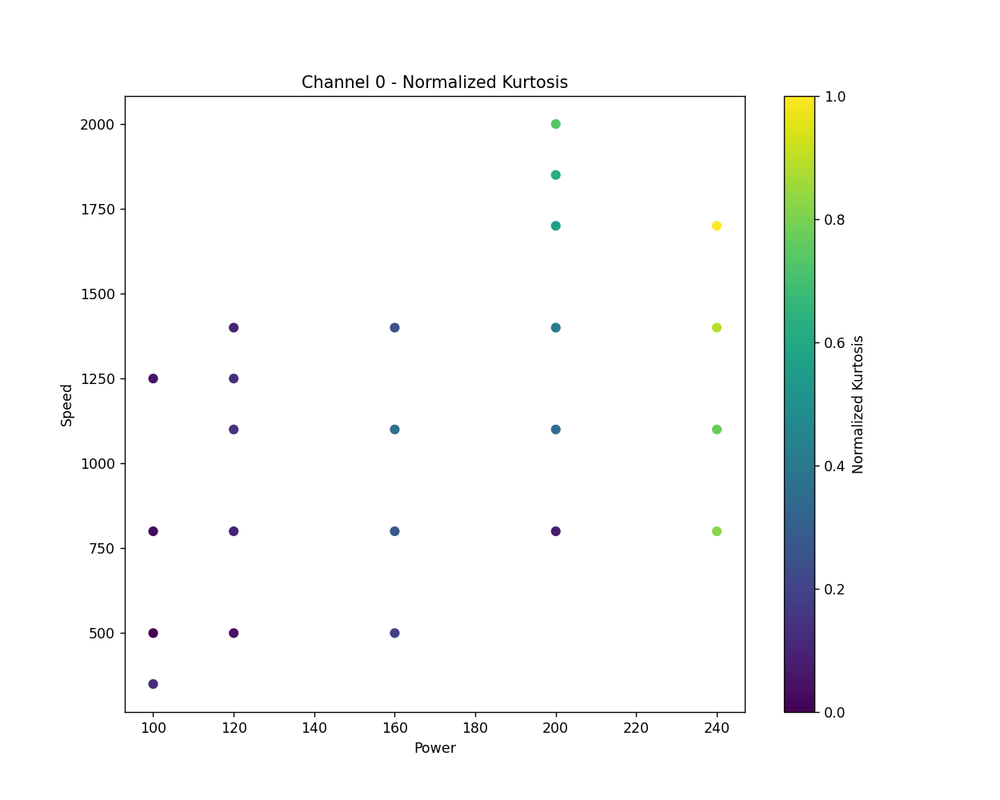

<IPython.core.display.Javascript object>


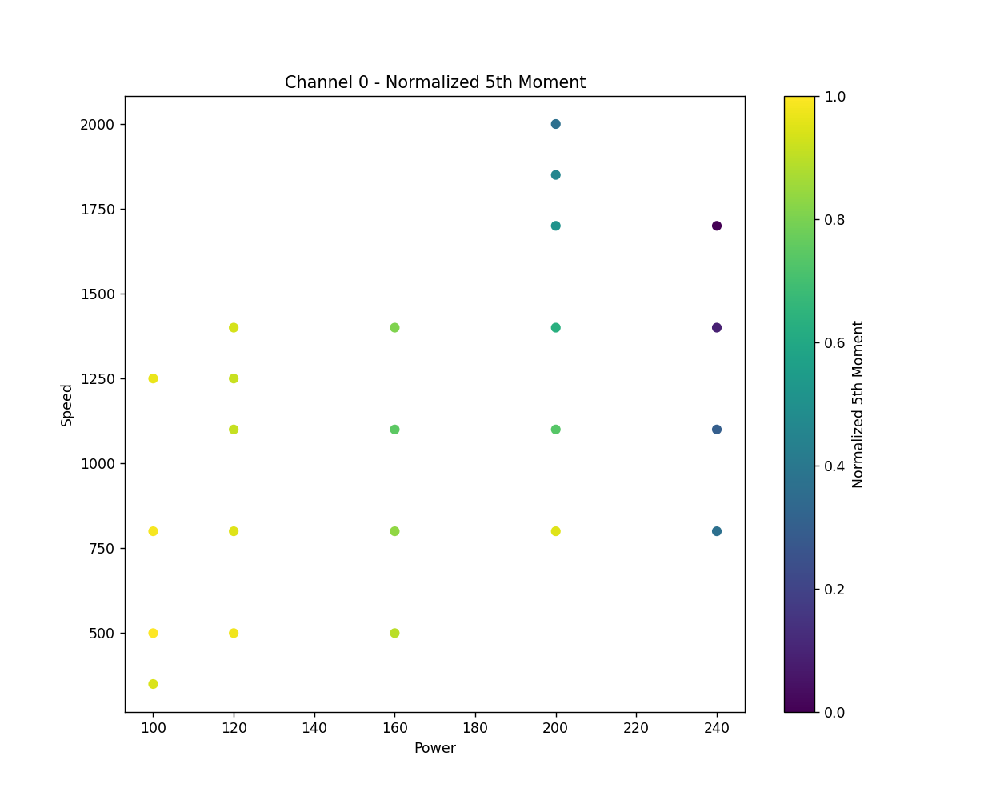

<IPython.core.display.Javascript object>


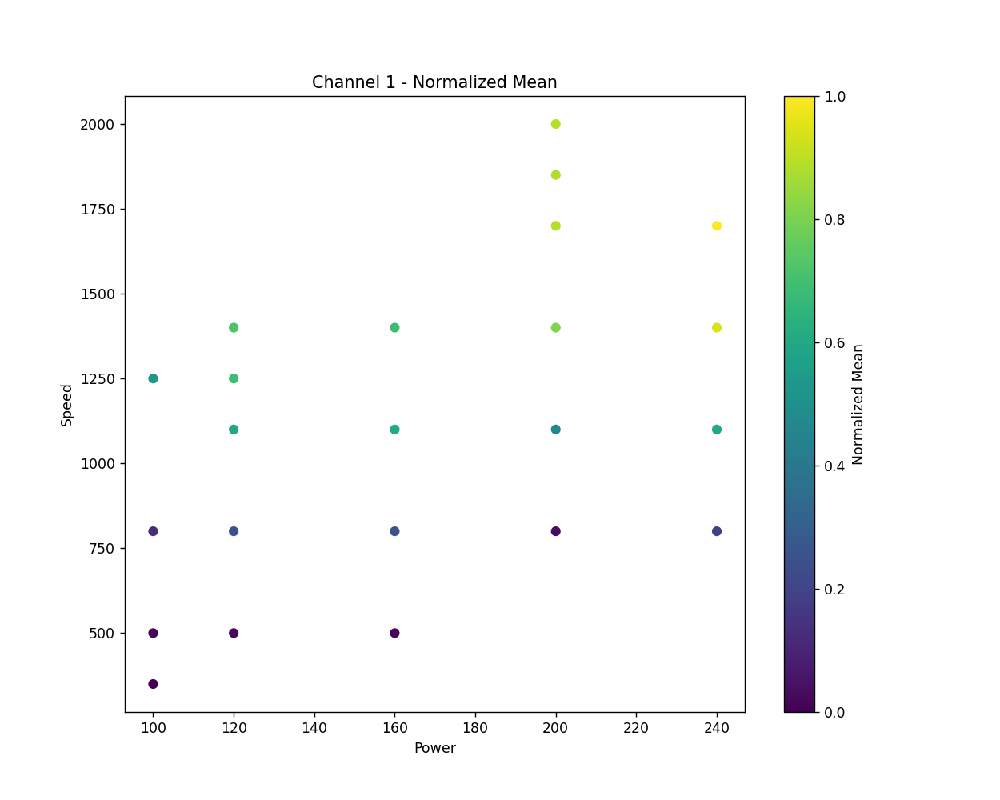

<IPython.core.display.Javascript object>


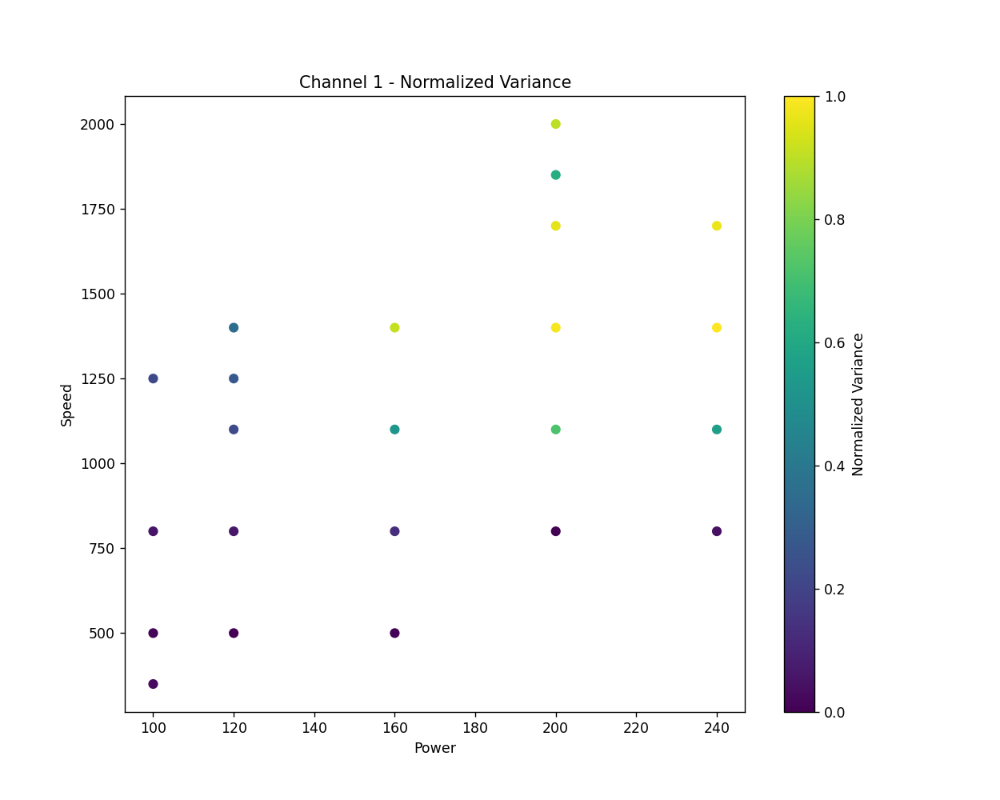

<IPython.core.display.Javascript object>


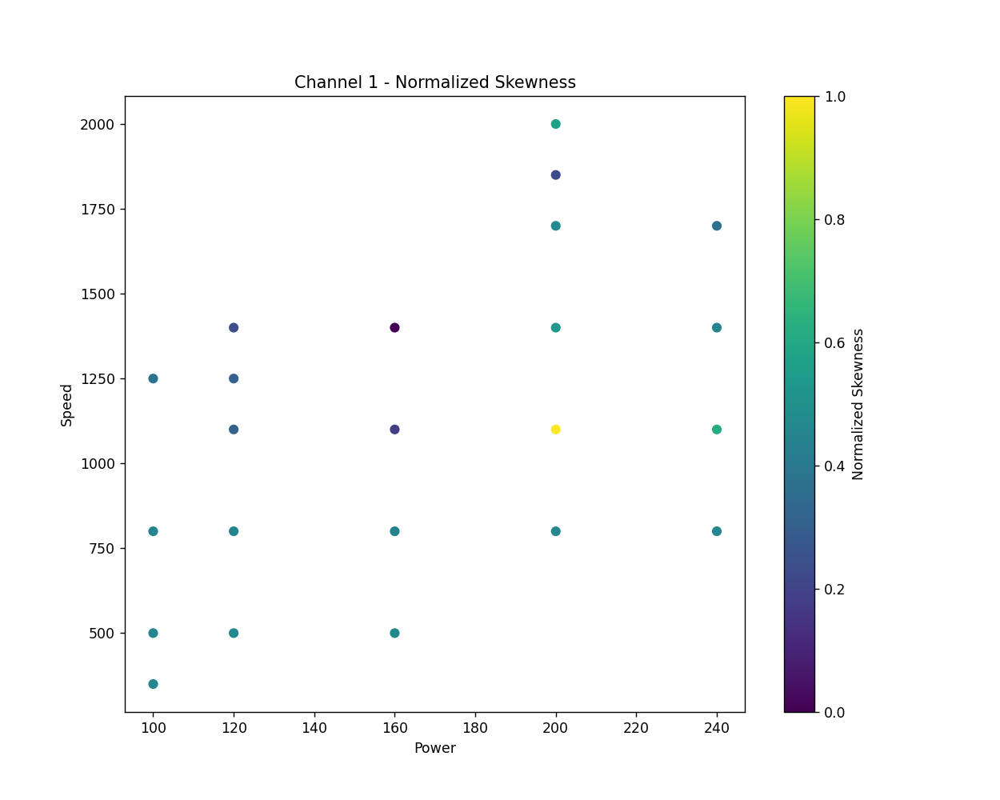

<IPython.core.display.Javascript object>


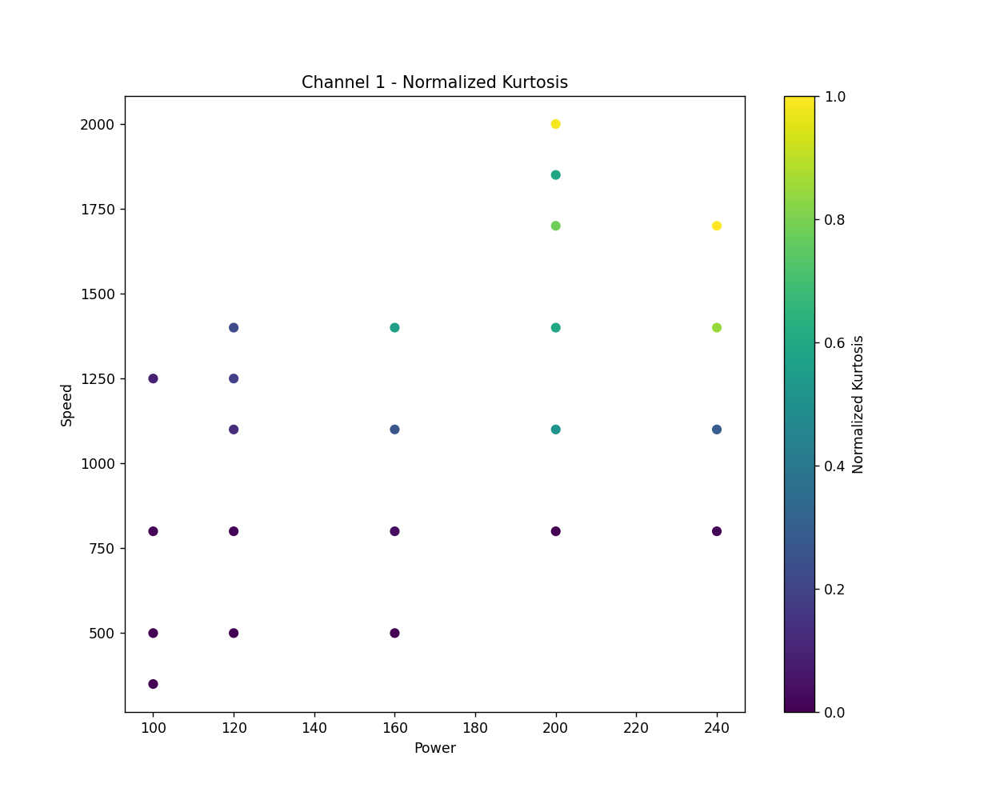

<IPython.core.display.Javascript object>


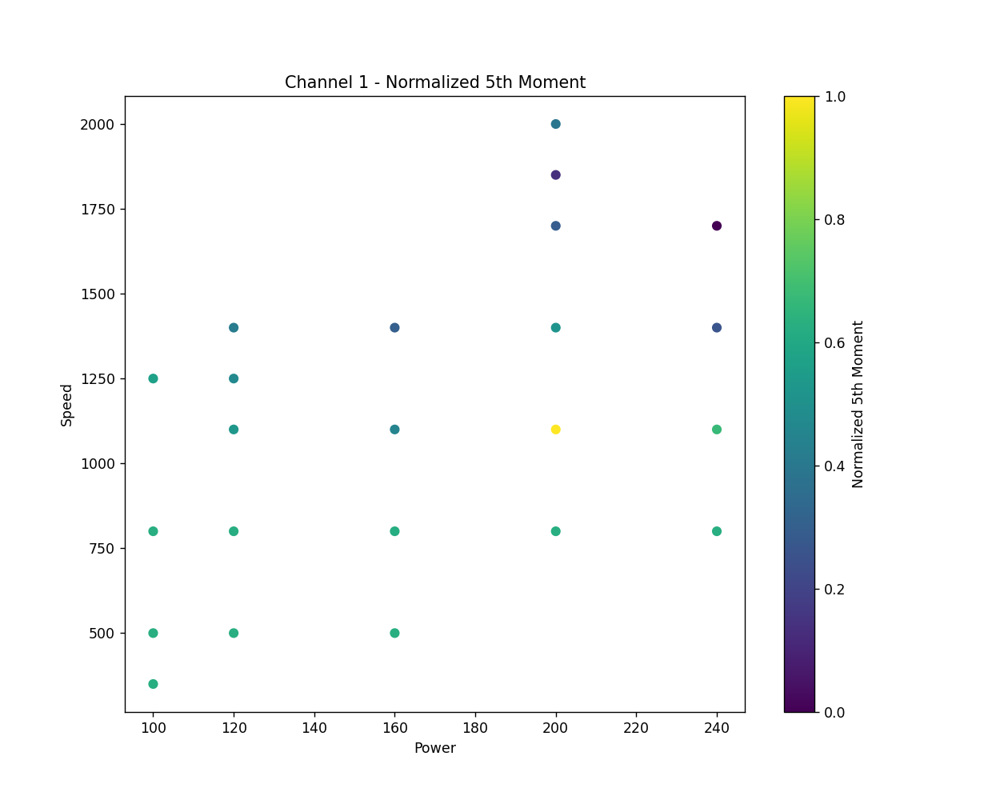

In [16]:
# Initialize containers for normalized moments
normalized_moments = {'channel_0': [[] for _ in range(5)], 'channel_1': [[] for _ in range(5)]}

# Normalize the moments across all conditions for each channel and each moment type
for channel in range(2):
    channel_key = f'channel_{channel}'
    
    for i in range(5):
        raw_moments = [condition_data[channel_key]['moments'][i] for condition_data in moments_dict.values()]
        min_val, max_val = min(raw_moments), max(raw_moments)
        
        normalized_moments[channel_key][i] = [(x - min_val) / (max_val - min_val) for x in raw_moments]

# Create the scatter plots for each normalized moment
for channel in range(2):
    channel_key = f'channel_{channel}'
    
    # Initialize the data for the scatter plots
    power = []
    speed = []
    
    # Gather the data for the scatter plots
    for condition_number, condition_data in moments_dict.items():
        power.append(condition_data['info']['Power'])
        speed.append(condition_data['info']['Speed'])
            
    # Create the 5 scatter plots for each moment
    for i, moment_name in enumerate(moment_names):
        plt.figure(figsize=(10, 8))
        plt.scatter(power, speed, c=normalized_moments[channel_key][i], cmap='viridis')
        plt.colorbar(label=f'Normalized {moment_name}')
        plt.xlabel('Power')
        plt.ylabel('Speed')
        plt.title(f'Channel {channel} - Normalized {moment_name}')
        plt.show()

<IPython.core.display.Javascript object>


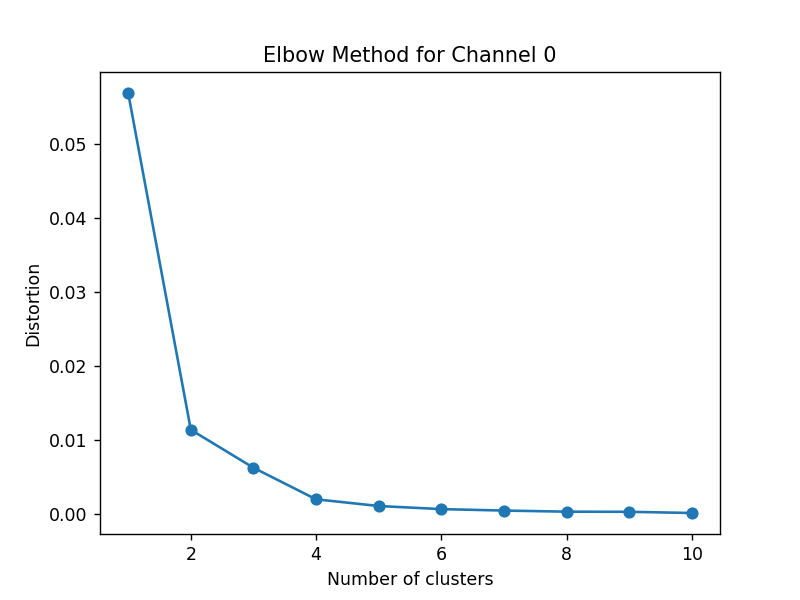

Enter the optimal number of clusters for channel 0: 2


<IPython.core.display.Javascript object>


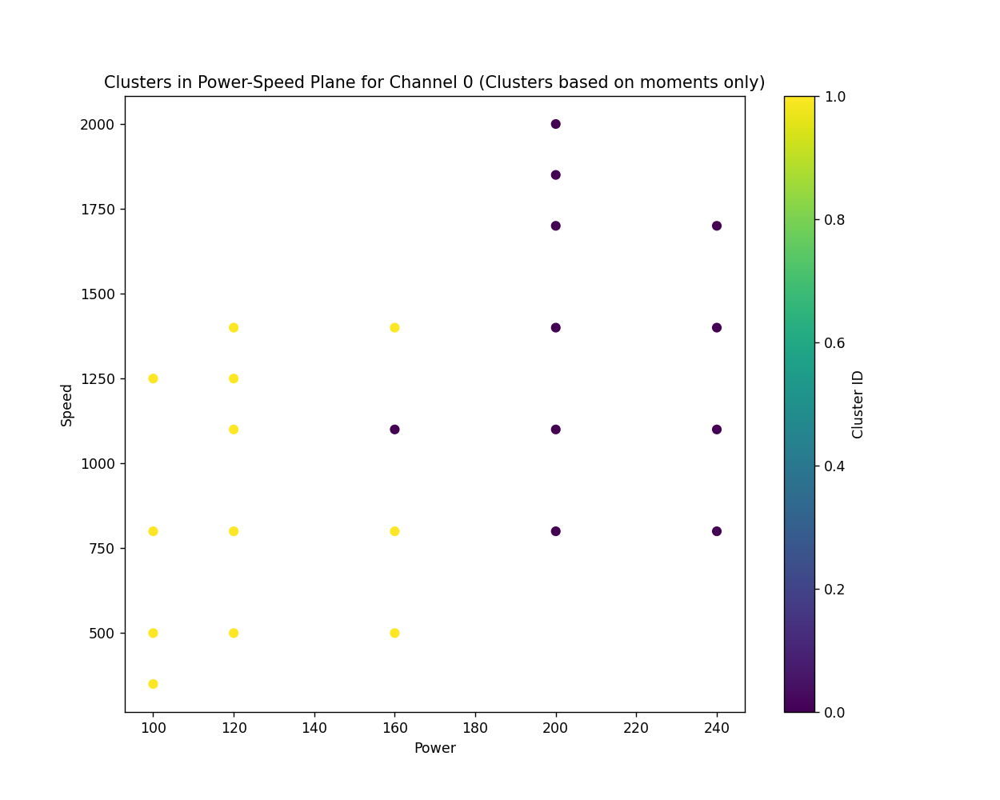

<IPython.core.display.Javascript object>


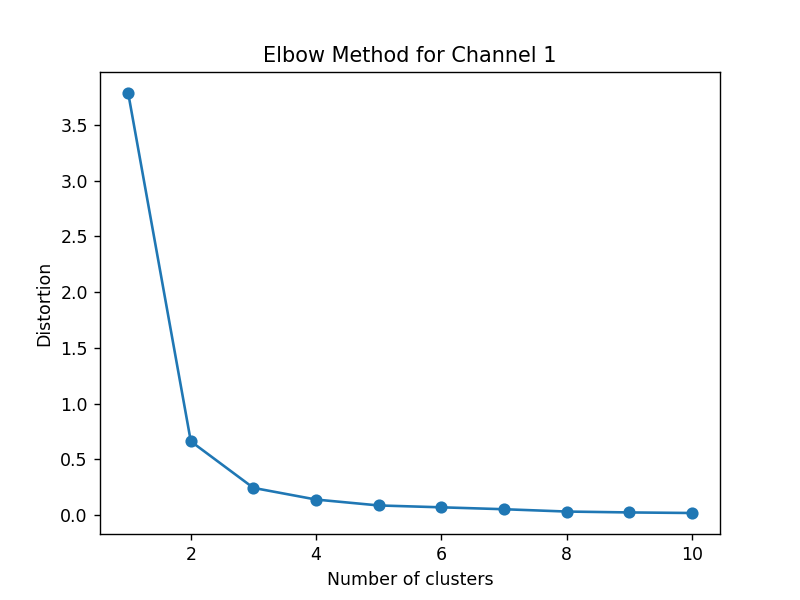

Enter the optimal number of clusters for channel 1: 2


<IPython.core.display.Javascript object>


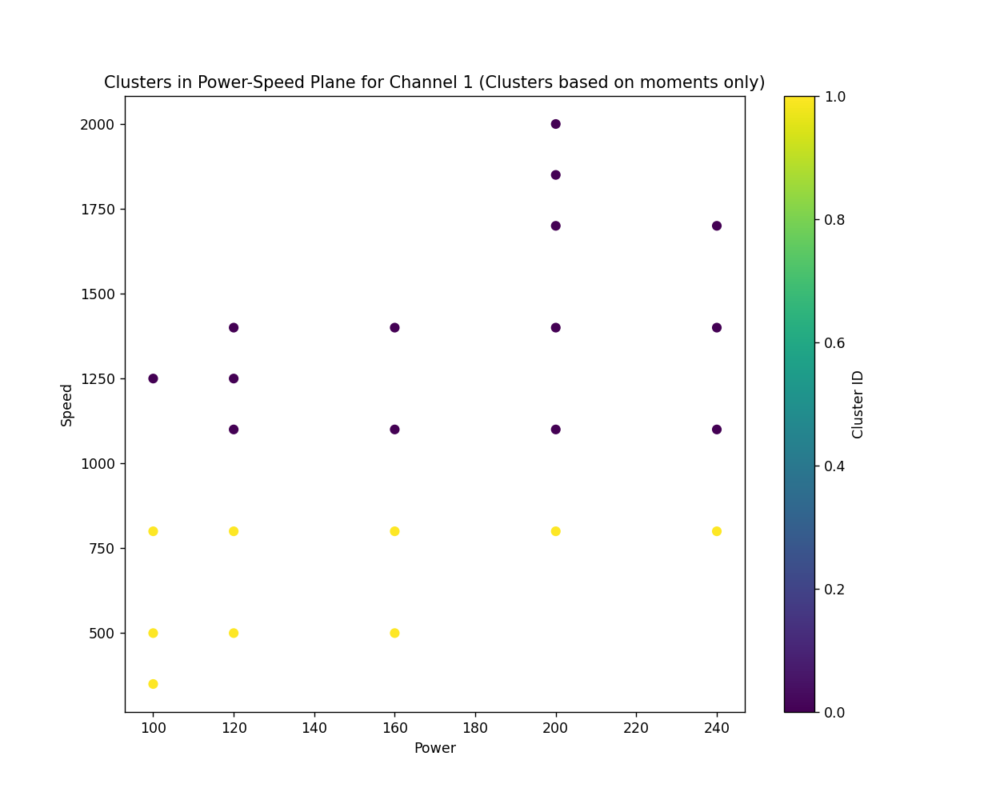

In [18]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Loop through each channel
for channel in range(2):
    channel_key = f'channel_{channel}'
    
    # Initialize the data for clustering
    clustering_data = []
    
    # Gather the data for clustering
    for condition_number, condition_data in moments_dict.items():
        moments = condition_data[channel_key]['moments']
        clustering_data.append(moments)

    clustering_data = np.array(clustering_data)
    
    # Step 2: Optimal k Analysis using the Elbow Method
    distortions = []
    K_range = range(1, 11)
    for k in K_range:
        kmeans = KMeans(n_clusters=k, n_init=2)
        kmeans.fit(clustering_data)
        distortions.append(kmeans.inertia_)

    plt.figure()
    plt.plot(K_range, distortions, marker='o')
    plt.title(f'Elbow Method for Channel {channel}')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.show()

    # Choose the optimal k (you can also set this manually after observing the elbow plot)
    optimal_k = int(input(f"Enter the optimal number of clusters for channel {channel}: "))
    
    # Step 3: Final Clustering
    kmeans = KMeans(n_clusters=optimal_k, n_init=2)
    kmeans.fit(clustering_data)
    labels = kmeans.labels_

    # Step 4: Plotting the clusters in the power-speed plane, color-coded by cluster ID
    power = [condition_data['info']['Power'] for condition_data in moments_dict.values()]
    speed = [condition_data['info']['Speed'] for condition_data in moments_dict.values()]

    plt.figure(figsize=(10, 8))
    plt.scatter(power, speed, c=labels, cmap='viridis')
    plt.colorbar(label='Cluster ID')
    plt.xlabel('Power')
    plt.ylabel('Speed')
    plt.title(f'Clusters in Power-Speed Plane for Channel {channel} (Clusters based on moments only)')
    plt.show()


<IPython.core.display.Javascript object>


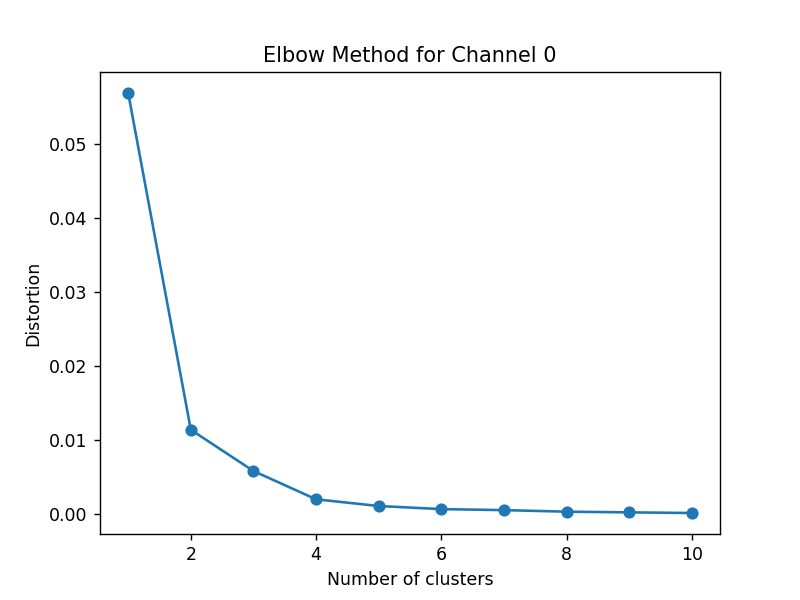

Enter the optimal number of clusters for channel 0: 2


<IPython.core.display.Javascript object>


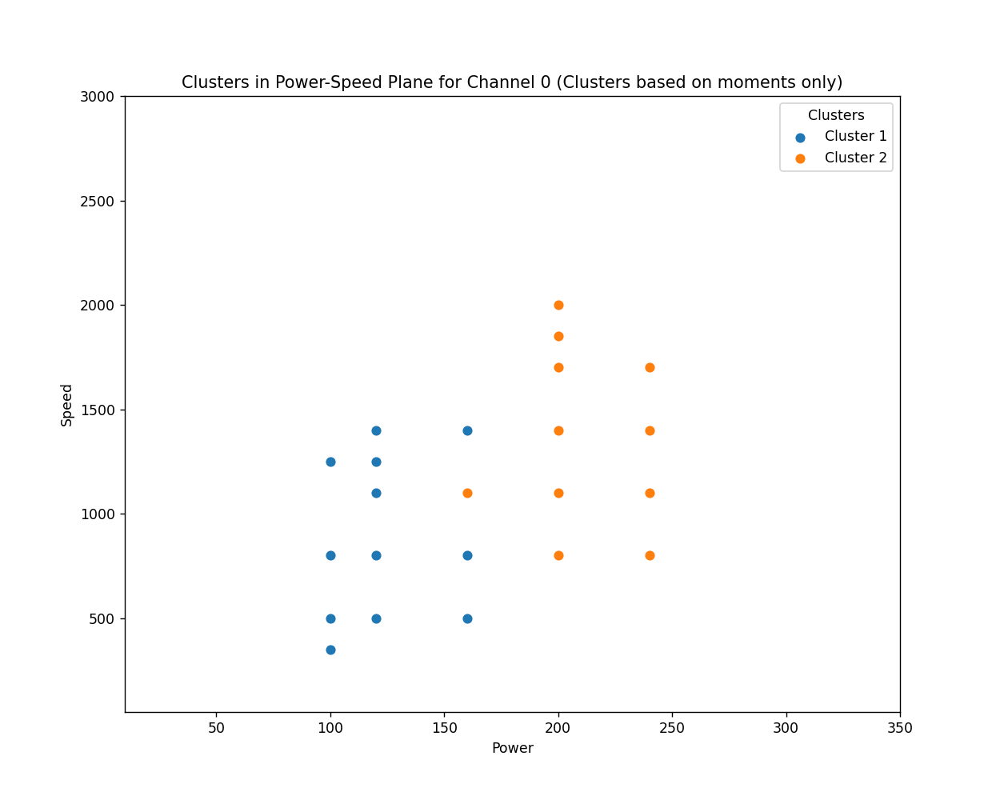

<IPython.core.display.Javascript object>


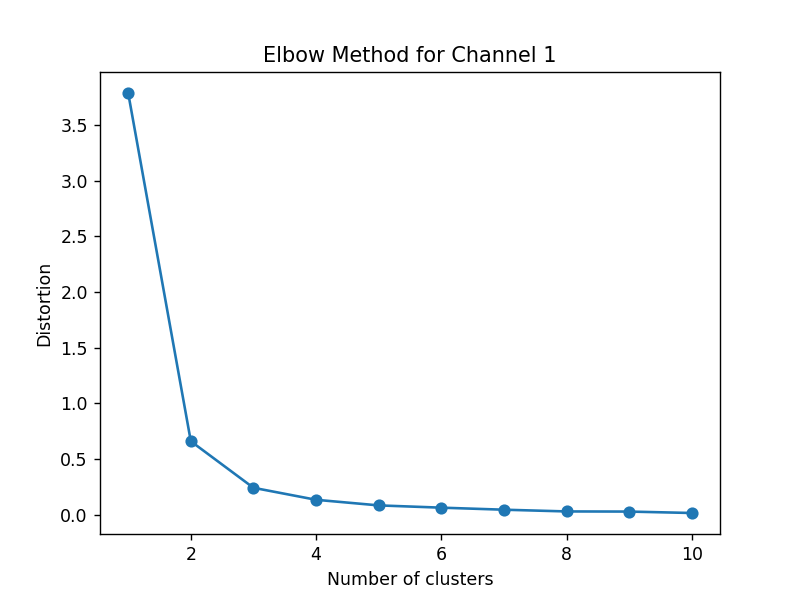

Enter the optimal number of clusters for channel 1: 2


<IPython.core.display.Javascript object>


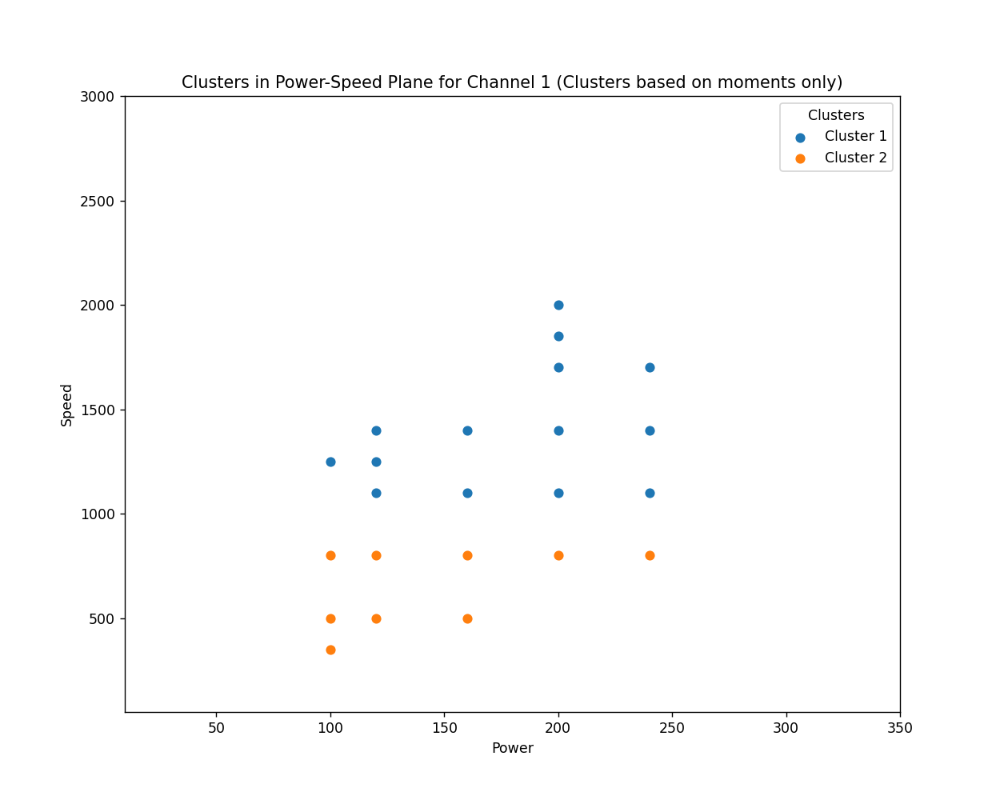

In [19]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Loop through each channel
for channel in range(2):
    channel_key = f'channel_{channel}'
    
    # Initialize the data for clustering
    clustering_data = []
    
    # Gather the data for clustering
    for condition_number, condition_data in moments_dict.items():
        moments = condition_data[channel_key]['moments']
        clustering_data.append(moments)

    clustering_data = np.array(clustering_data)
    
    # Step 2: Optimal k Analysis using the Elbow Method
    distortions = []
    K_range = range(1, 11)
    for k in K_range:
        kmeans = KMeans(n_clusters=k, n_init=2)
        kmeans.fit(clustering_data)
        distortions.append(kmeans.inertia_)

    plt.figure()
    plt.plot(K_range, distortions, marker='o')
    plt.title(f'Elbow Method for Channel {channel}')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.show()

    # Choose the optimal k (you can also set this manually after observing the elbow plot)
    optimal_k = int(input(f"Enter the optimal number of clusters for channel {channel}: "))
    
    # Step 3: Final Clustering
    kmeans = KMeans(n_clusters=optimal_k, n_init=2)
    kmeans.fit(clustering_data)
    labels = kmeans.labels_

    # Step 4: Plotting the clusters in the power-speed plane, labeled by cluster ID
    power = [condition_data['info']['Power'] for condition_data in moments_dict.values()]
    speed = [condition_data['info']['Speed'] for condition_data in moments_dict.values()]

    plt.figure(figsize=(10, 8))

    # Create a scatter plot for each cluster and add a legend entry for it
    unique_labels = np.unique(labels)
    for label in unique_labels:
        idx = np.where(labels == label)
        plt.scatter(np.array(power)[idx], np.array(speed)[idx], label=f'Cluster {label + 1}')

    plt.xlabel('Power')
    plt.ylabel('Speed')

    # Set the x and y-axis limits
    plt.xlim(10, 350)
    plt.ylim(50, 3000)

    plt.title(f'Clusters in Power-Speed Plane for Channel {channel} (Clusters based on moments only)')
    plt.legend(title='Clusters')

    plt.show()


<IPython.core.display.Javascript object>


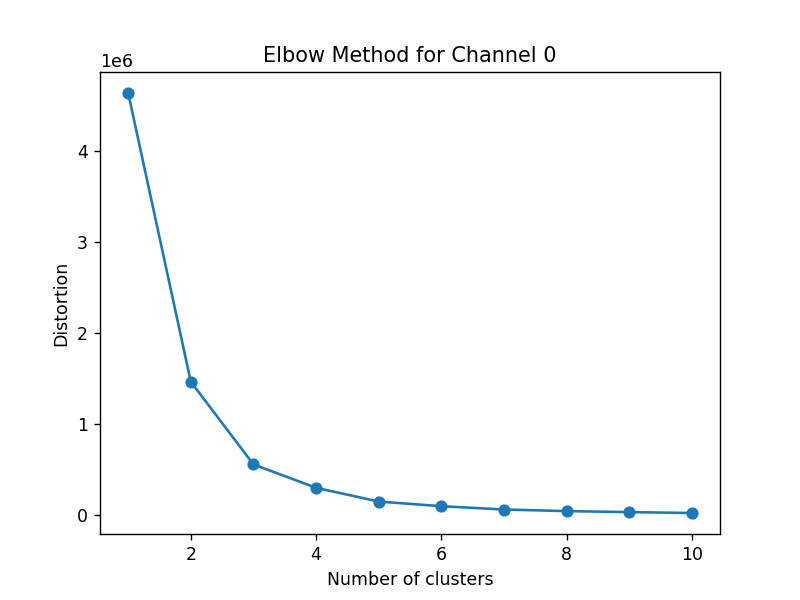

Enter the optimal number of clusters for channel 0: 2


<IPython.core.display.Javascript object>


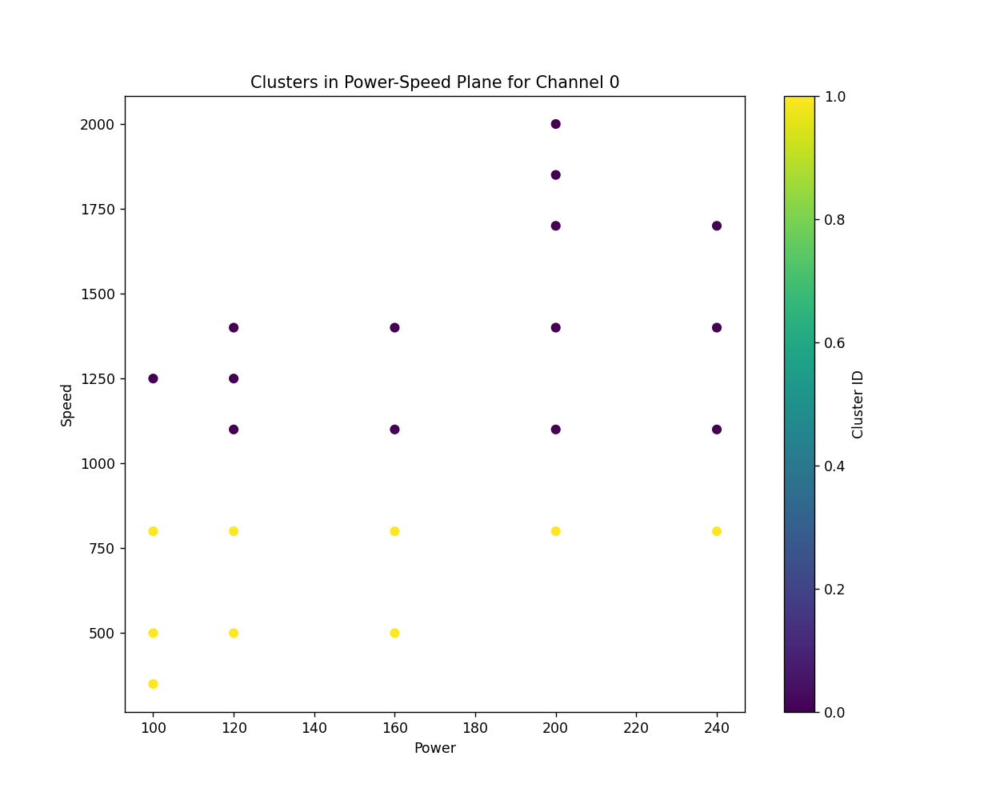

<IPython.core.display.Javascript object>


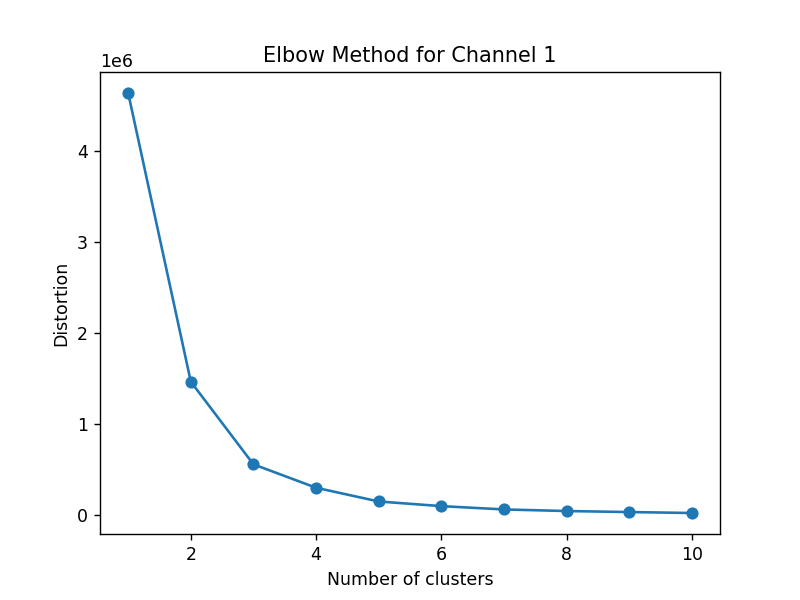

Enter the optimal number of clusters for channel 1: 2


<IPython.core.display.Javascript object>


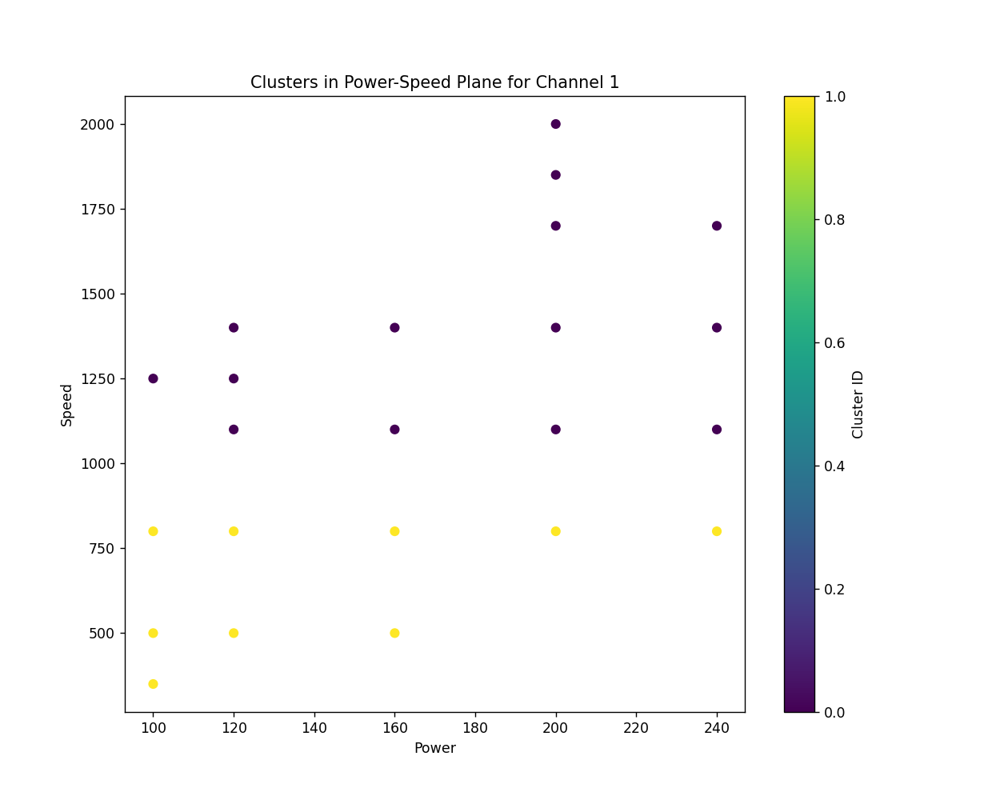

In [20]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Loop through each channel
for channel in range(2):
    channel_key = f'channel_{channel}'
    
    # Initialize the data for clustering
    clustering_data = []
    
    # Gather the data for clustering
    for condition_number, condition_data in moments_dict.items():
        power = condition_data['info']['Power']
        speed = condition_data['info']['Speed']
        moments = condition_data[channel_key]['moments']
        clustering_data.append([power, speed] + moments)

    clustering_data = np.array(clustering_data)
    
    # Step 2: Optimal k Analysis using the Elbow Method
    distortions = []
    K_range = range(1, 11)
    for k in K_range:
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(clustering_data)
        distortions.append(kmeans.inertia_)

    plt.figure()
    plt.plot(K_range, distortions, marker='o')
    plt.title(f'Elbow Method for Channel {channel}')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.show()

    # Choose the optimal k (you can also set this manually after observing the elbow plot)
    optimal_k = int(input(f"Enter the optimal number of clusters for channel {channel}: "))
    
    # Step 3: Final Clustering and Plotting
    kmeans = KMeans(n_clusters=optimal_k)
    kmeans.fit(clustering_data)
    labels = kmeans.labels_

    plt.figure(figsize=(10, 8))
    plt.scatter(clustering_data[:, 0], clustering_data[:, 1], c=labels, cmap='viridis')
    plt.colorbar(label='Cluster ID')
    plt.xlabel('Power')
    plt.ylabel('Speed')
    plt.title(f'Clusters in Power-Speed Plane for Channel {channel}')
    plt.show()


<IPython.core.display.Javascript object>


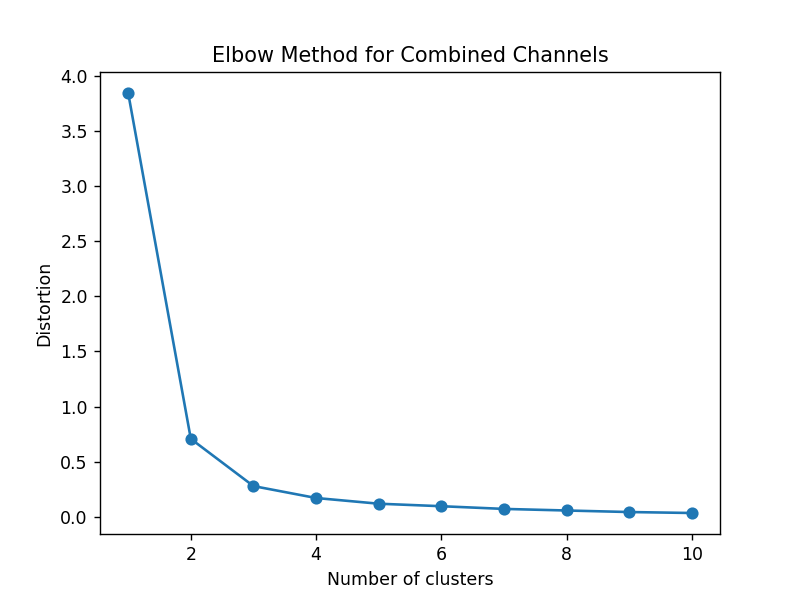

Enter the optimal number of clusters for combined channels: 2


<IPython.core.display.Javascript object>


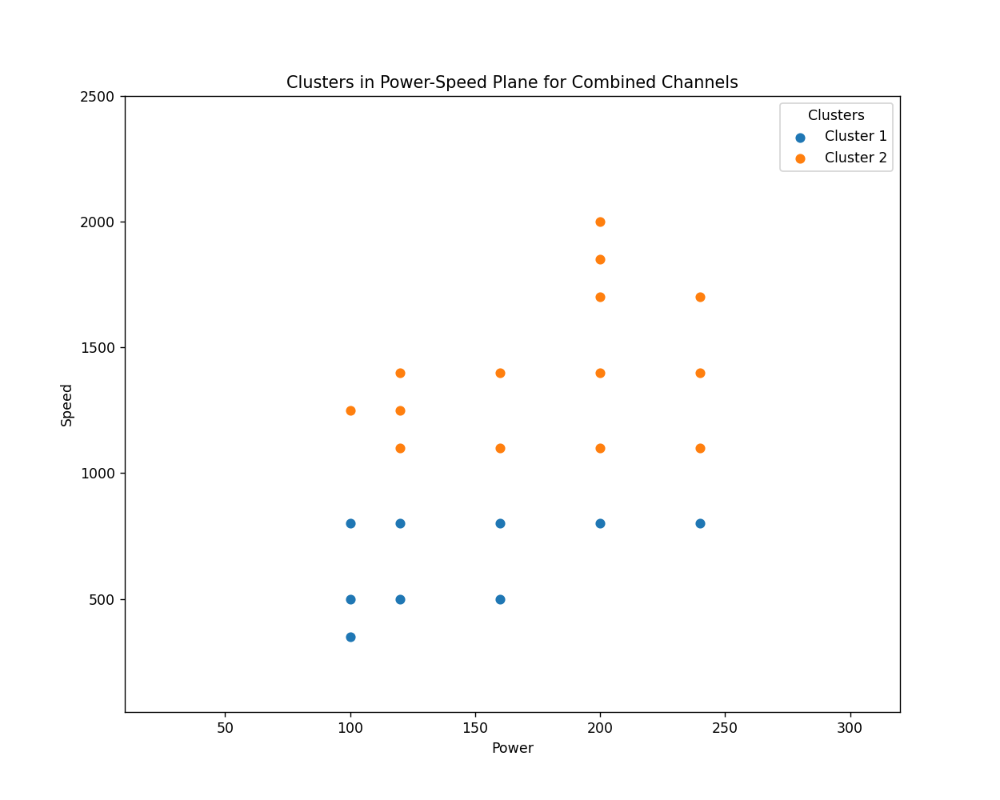

In [21]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# Initialize the data for clustering
clustering_data = []

# Gather the data for clustering
for condition_number, condition_data in moments_dict.items():
    moments_channel_0 = condition_data['channel_0']['moments']
    moments_channel_1 = condition_data['channel_1']['moments']
    combined_moments = moments_channel_0 + moments_channel_1  # Concatenating moments from both channels
    clustering_data.append(combined_moments)

clustering_data = np.array(clustering_data)

# Step 2: Optimal k Analysis using the Elbow Method
distortions = []
K_range = range(1, 11)
for k in K_range:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(clustering_data)
    distortions.append(kmeans.inertia_)

plt.figure()
plt.plot(K_range, distortions, marker='o')
plt.title('Elbow Method for Combined Channels')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

# Choose the optimal k (you can also set this manually after observing the elbow plot)
optimal_k = int(input("Enter the optimal number of clusters for combined channels: "))

# Step 3: Final Clustering
kmeans = KMeans(n_clusters=optimal_k)
kmeans.fit(clustering_data)
labels = kmeans.labels_

# Step 4: Plotting the clusters in the power-speed plane, labeled by cluster ID
power = [condition_data['info']['Power'] for condition_data in moments_dict.values()]
speed = [condition_data['info']['Speed'] for condition_data in moments_dict.values()]

plt.figure(figsize=(10, 8))

# Create a scatter plot for each cluster and add a legend entry for it
unique_labels = np.unique(labels)
for label in unique_labels:
    idx = np.where(labels == label)
    plt.scatter(np.array(power)[idx], np.array(speed)[idx], label=f'Cluster {label + 1}')

plt.xlabel('Power')
plt.ylabel('Speed')

# Set the x and y-axis limits
plt.xlim(10, 320)
plt.ylim(50, 2500)

plt.title('Clusters in Power-Speed Plane for Combined Channels')
plt.legend(title='Clusters')

plt.show()


Enter the optimal number of clusters for combined channels: 2


<IPython.core.display.Javascript object>


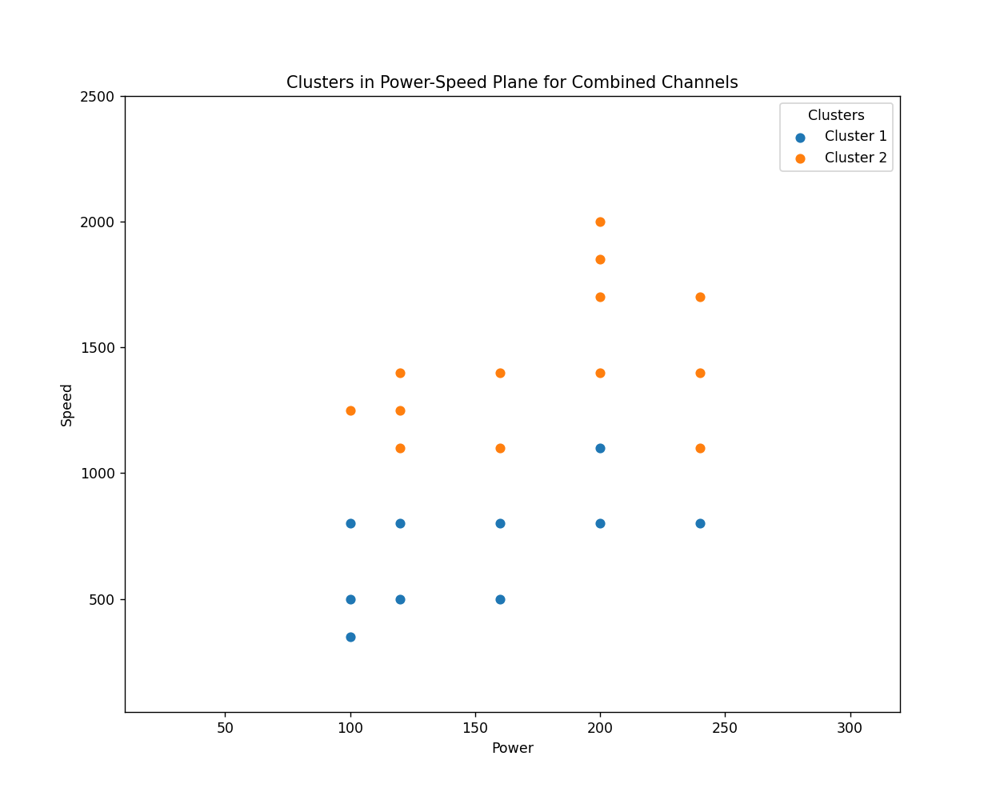

In [22]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import SpectralClustering

# Initialize the data for clustering
clustering_data = []

# Gather the data for clustering
for condition_number, condition_data in moments_dict.items():
    moments_channel_0 = condition_data['channel_0']['moments']
    moments_channel_1 = condition_data['channel_1']['moments']
    # Concatenate moments from both channels
    combined_moments = moments_channel_0 + moments_channel_1  
    clustering_data.append(combined_moments)

clustering_data = np.array(clustering_data)

# Choose the optimal number of clusters for Spectral Clustering
optimal_k = int(input("Enter the optimal number of clusters for combined channels: "))

# Perform Spectral Clustering
spectral = SpectralClustering(n_clusters=optimal_k, affinity='nearest_neighbors')
labels = spectral.fit_predict(clustering_data)

# Plotting the clusters in the power-speed plane, labeled by cluster ID
power = [condition_data['info']['Power'] for condition_data in moments_dict.values()]
speed = [condition_data['info']['Speed'] for condition_data in moments_dict.values()]

plt.figure(figsize=(10, 8))

# Create a scatter plot for each cluster and add a legend entry for it
unique_labels = np.unique(labels)
for label in unique_labels:
    idx = np.where(labels == label)
    plt.scatter(np.array(power)[idx], np.array(speed)[idx], label=f'Cluster {label + 1}')

plt.xlabel('Power')
plt.ylabel('Speed')

# Set the x and y-axis limits
plt.xlim(10, 320)
plt.ylim(50, 2500)

plt.title('Clusters in Power-Speed Plane for Combined Channels')
plt.legend(title='Clusters')

plt.show()


<IPython.core.display.Javascript object>


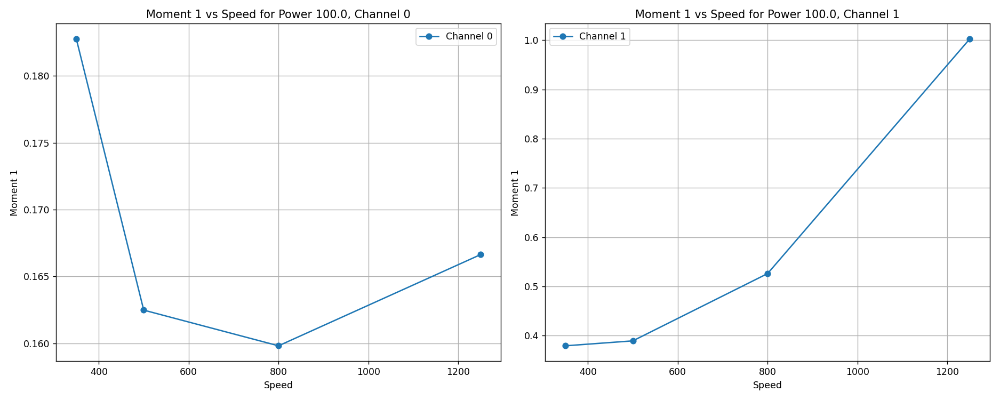

<IPython.core.display.Javascript object>


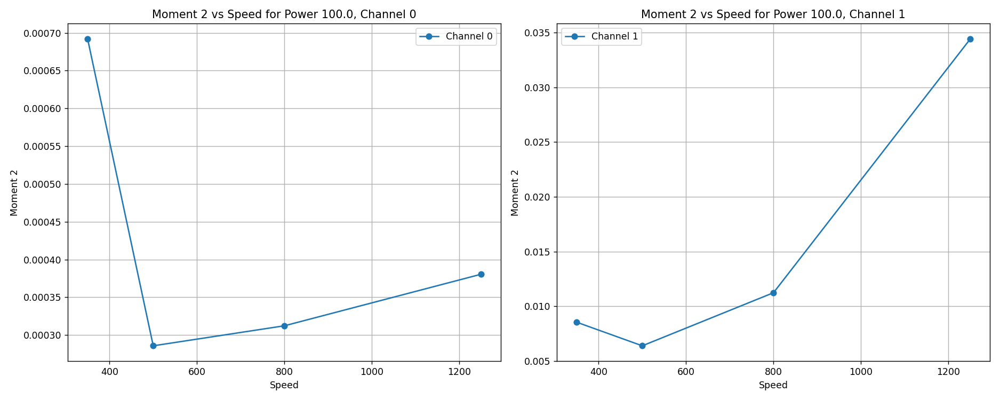

<IPython.core.display.Javascript object>


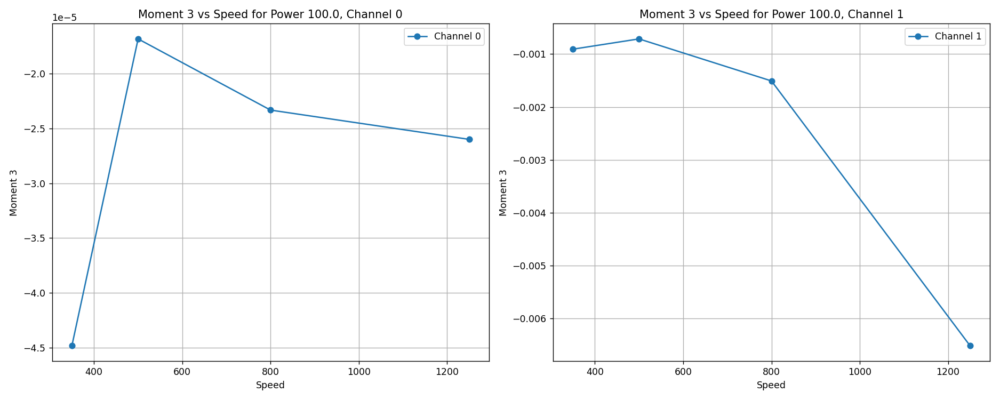

<IPython.core.display.Javascript object>


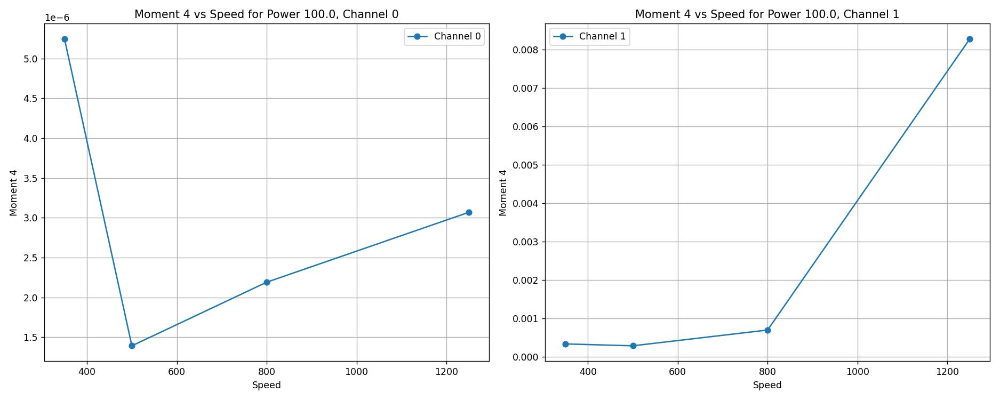

<IPython.core.display.Javascript object>


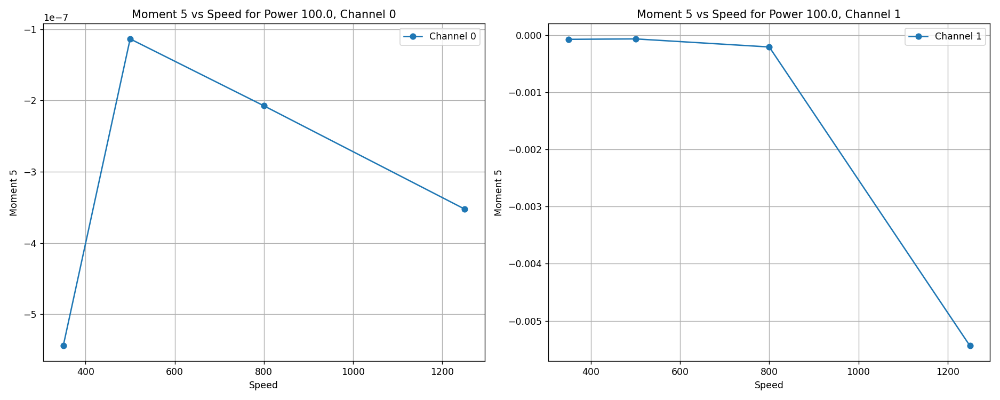

<IPython.core.display.Javascript object>


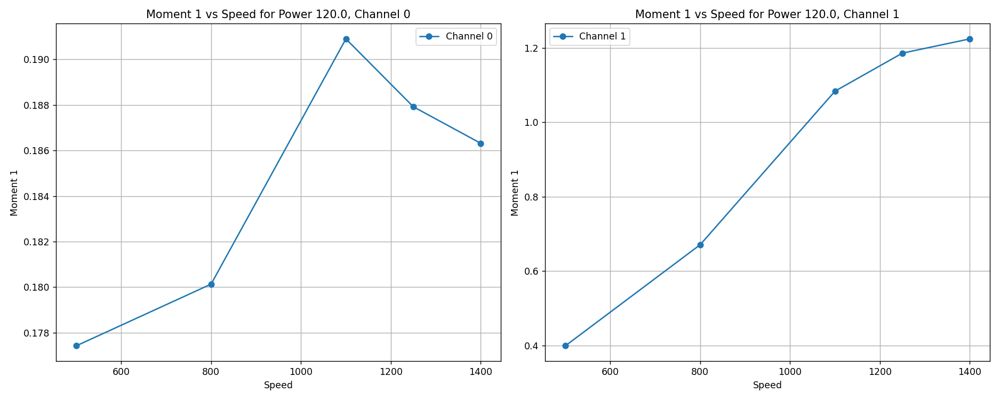

<IPython.core.display.Javascript object>


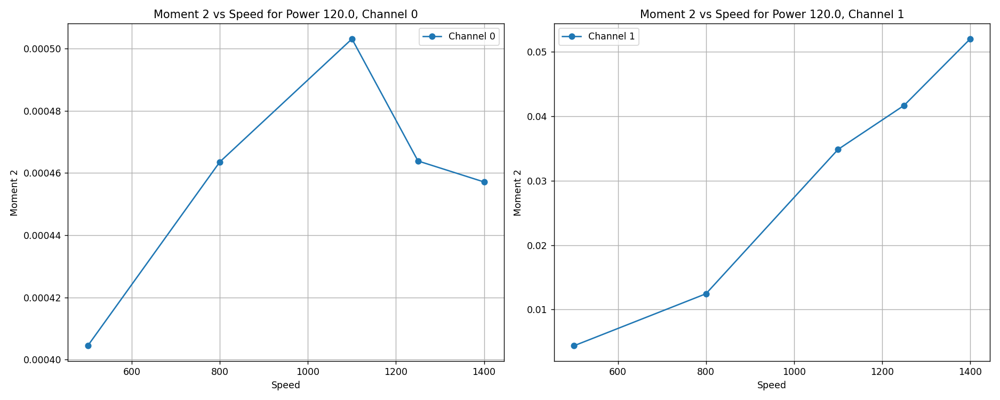

<IPython.core.display.Javascript object>


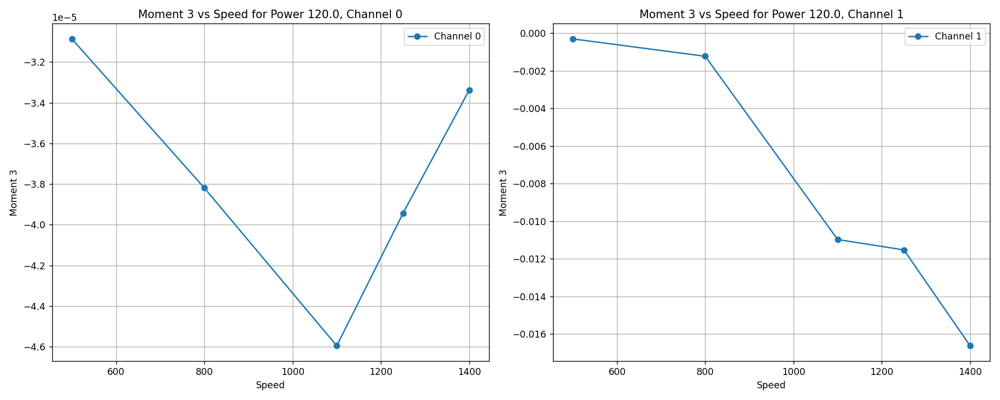

<IPython.core.display.Javascript object>


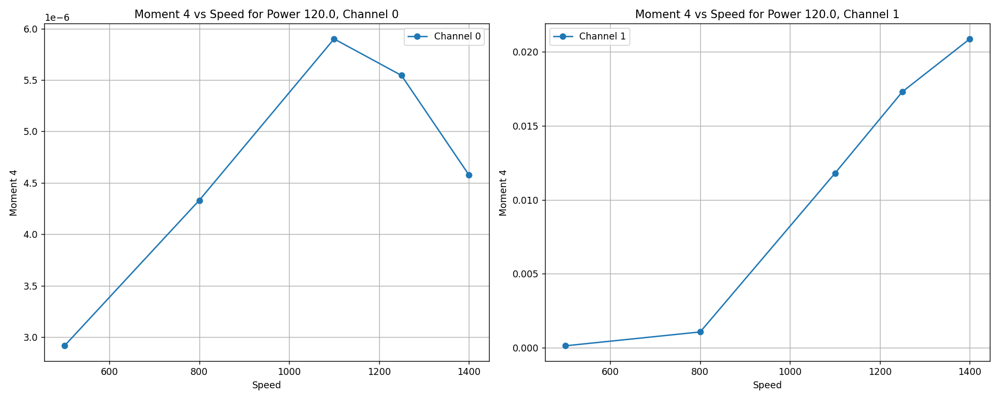

<IPython.core.display.Javascript object>


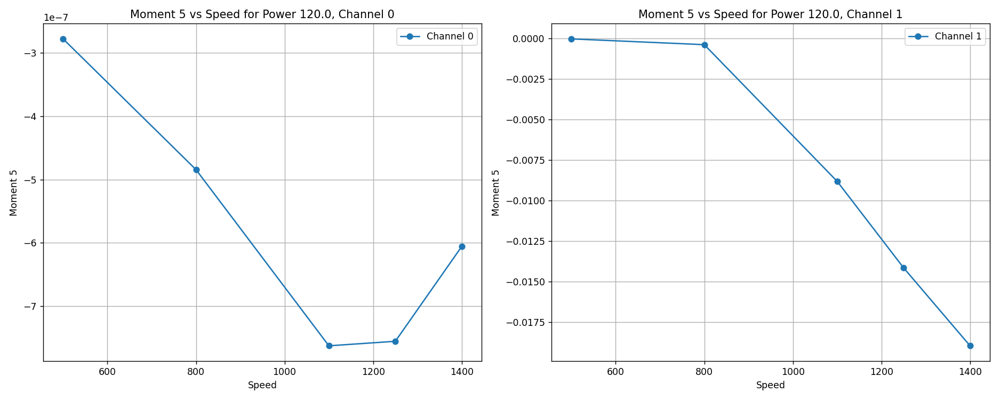

<IPython.core.display.Javascript object>


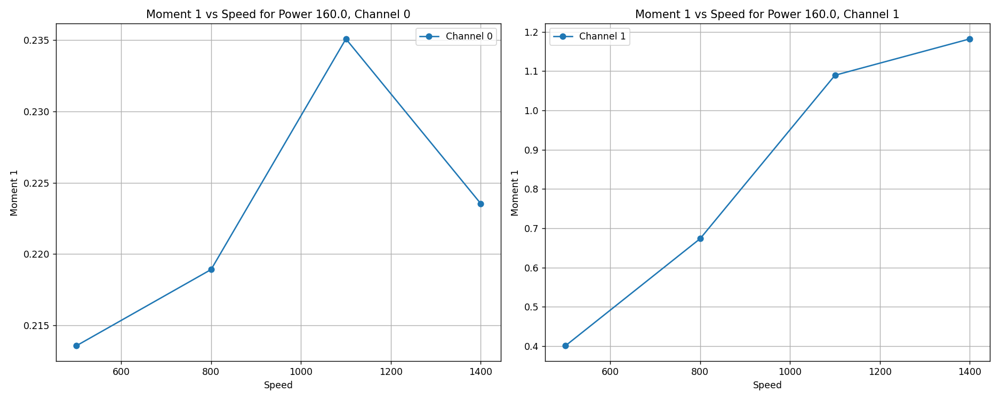

<IPython.core.display.Javascript object>


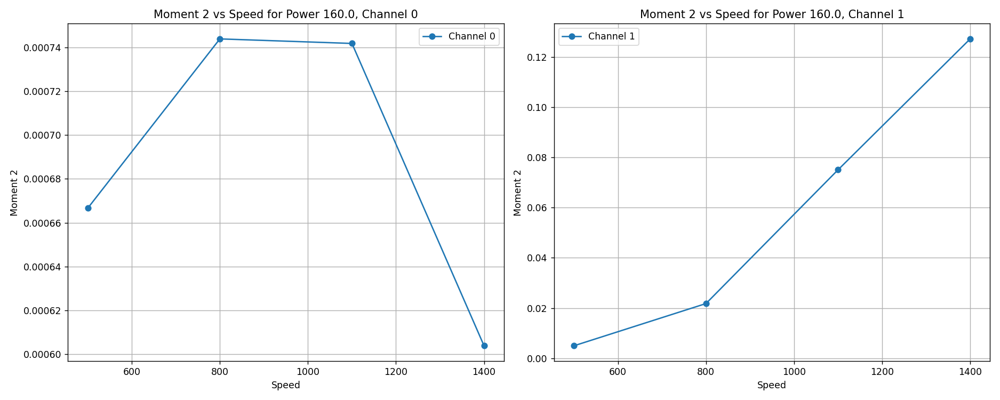

<IPython.core.display.Javascript object>


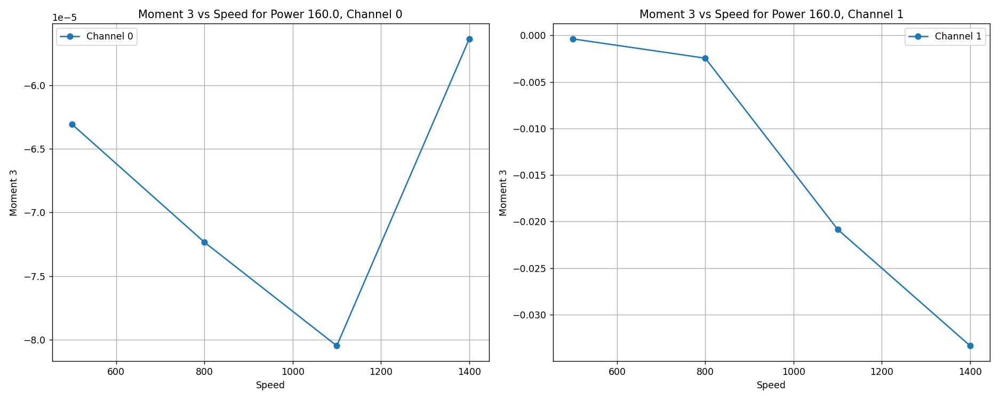

<IPython.core.display.Javascript object>


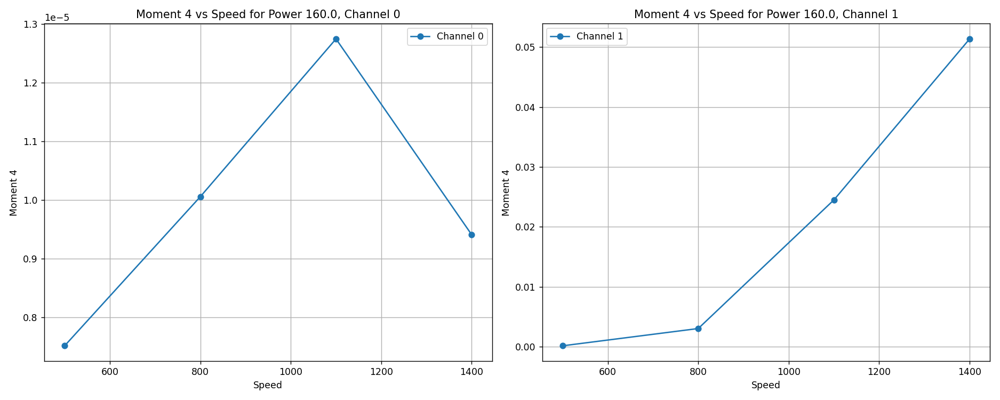

<IPython.core.display.Javascript object>


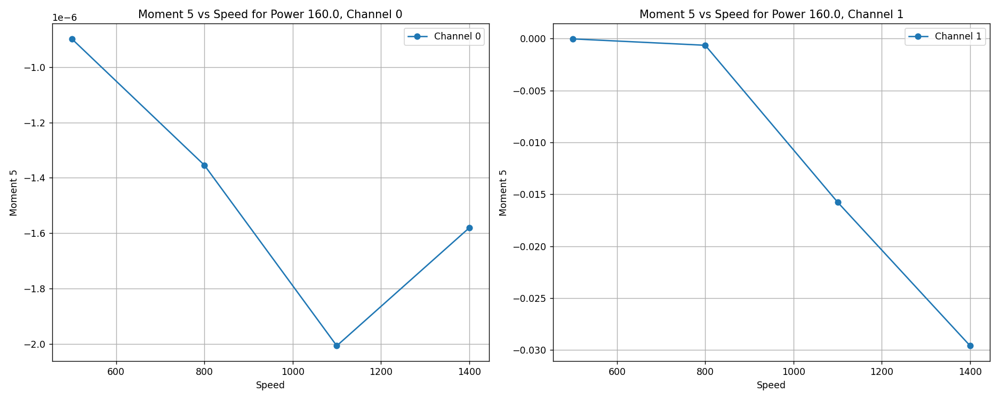

<IPython.core.display.Javascript object>


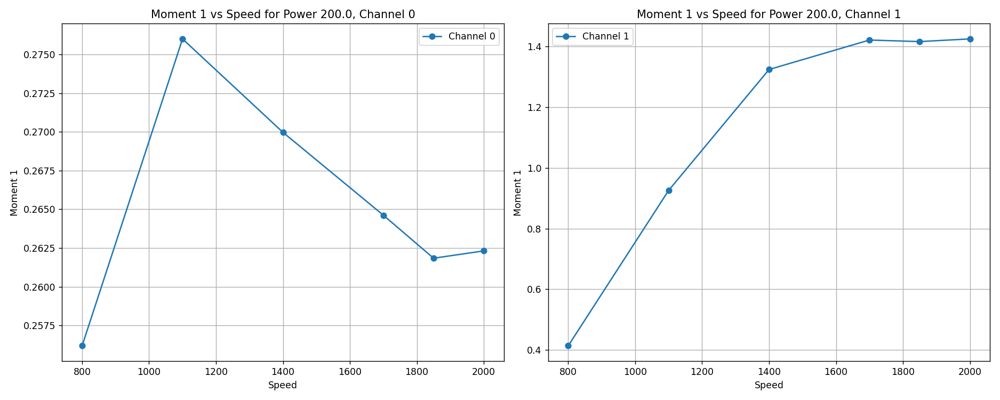

<IPython.core.display.Javascript object>


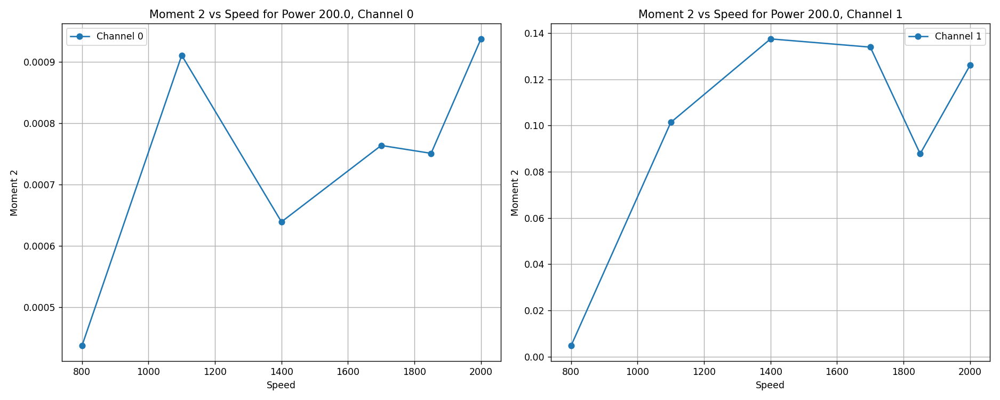

<IPython.core.display.Javascript object>


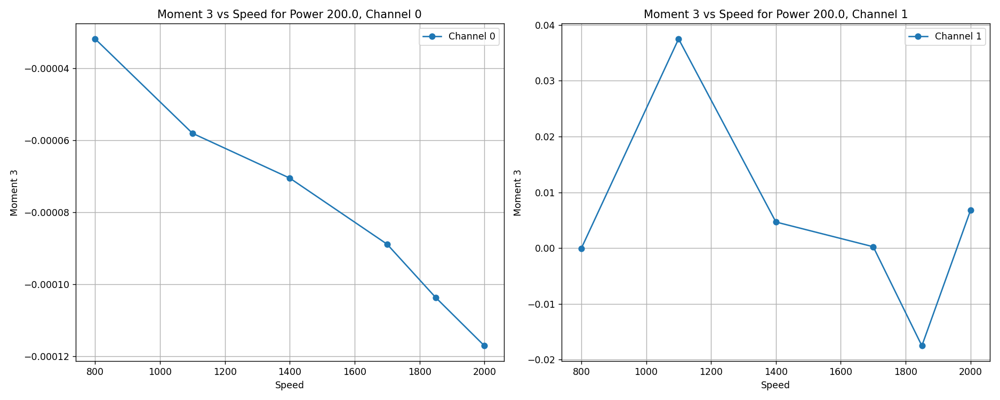

<IPython.core.display.Javascript object>


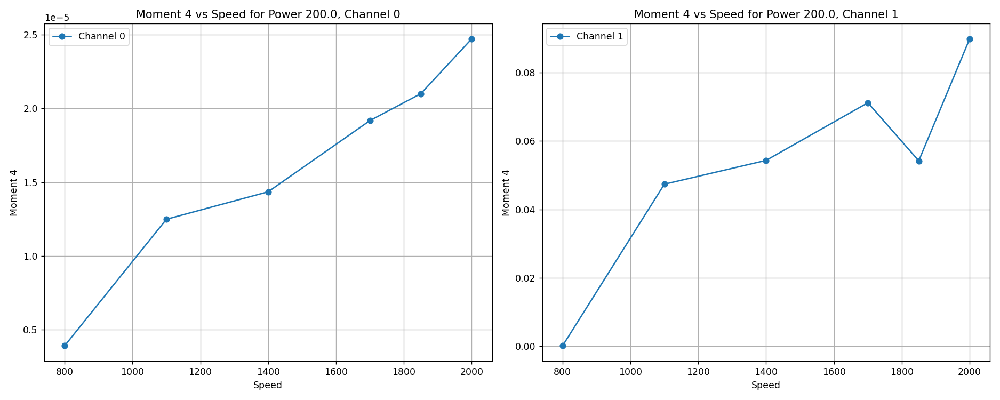

<IPython.core.display.Javascript object>


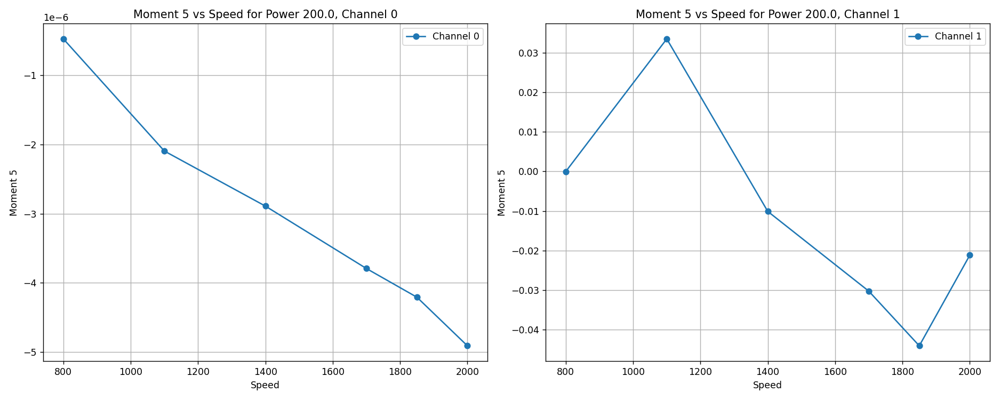

<IPython.core.display.Javascript object>


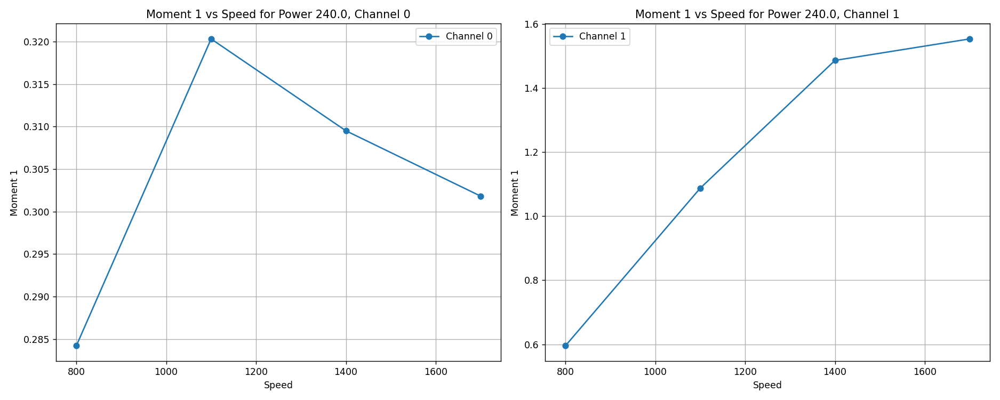

<IPython.core.display.Javascript object>


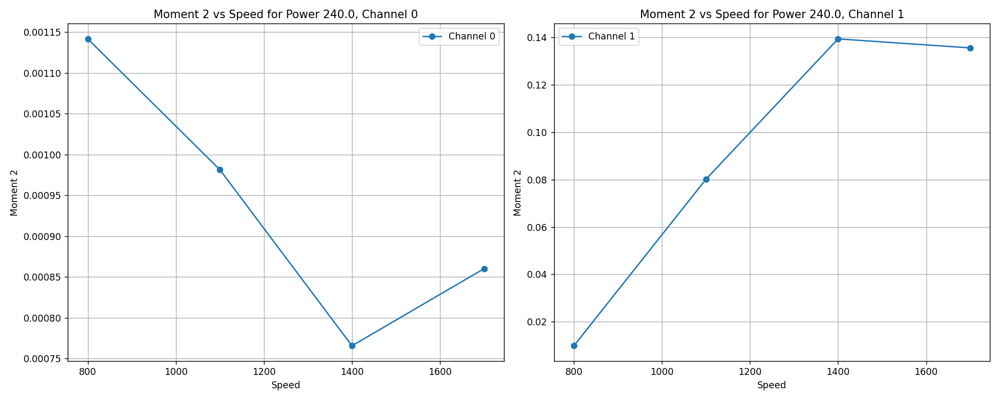

<IPython.core.display.Javascript object>


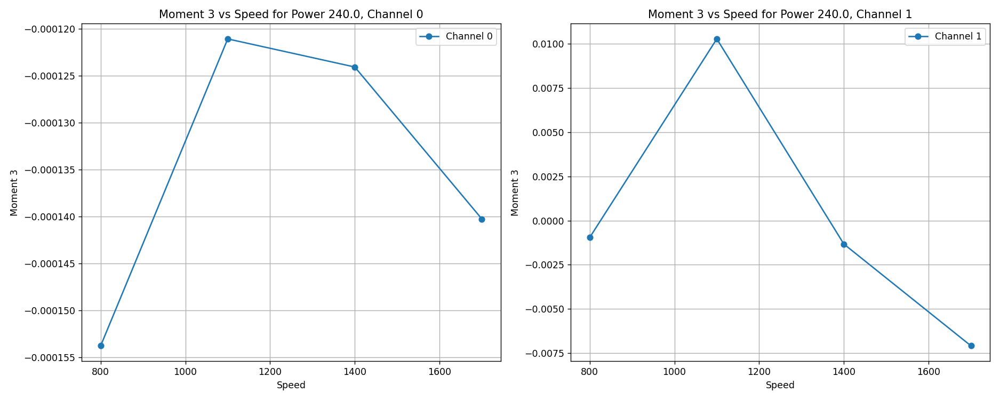

<IPython.core.display.Javascript object>


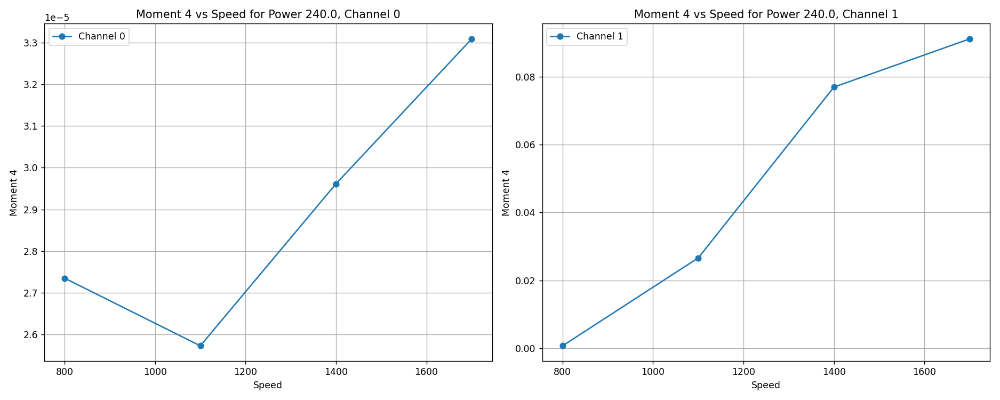

<IPython.core.display.Javascript object>


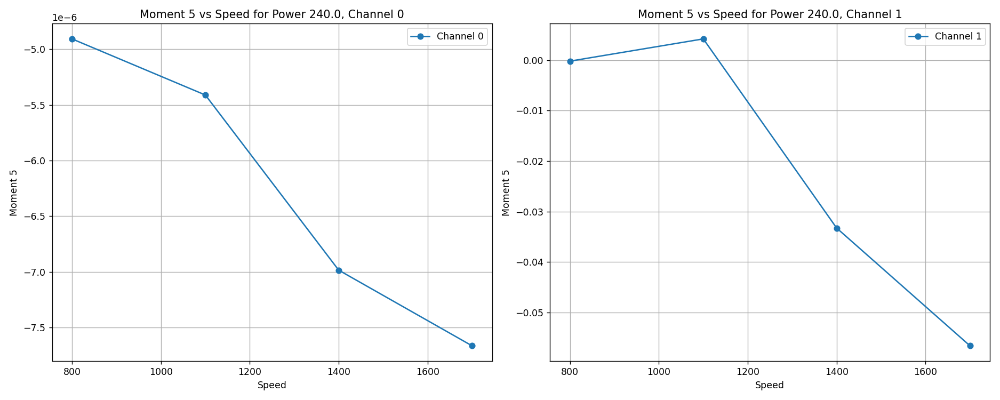

In [23]:
import matplotlib.pyplot as plt
import numpy as np

# Unique power levels
unique_powers = np.unique([condition_data['info']['Power'] for condition_data in moments_dict.values()])

# Number of moments
num_moments = 5

# Loop through unique power levels
for power in unique_powers:
    # Initialize data containers for the plots
    moment_data = {f'channel_0_moment_{i}': [] for i in range(num_moments)}
    moment_data.update({f'channel_1_moment_{i}': [] for i in range(num_moments)})
    speeds = []
    
    # Loop through each condition to gather data
    for condition_number, condition_data in moments_dict.items():
        if condition_data['info']['Power'] == power:
            speeds.append(condition_data['info']['Speed'])
            
            for channel in [0, 1]:
                for moment_index in range(num_moments):
                    key = f'channel_{channel}_moment_{moment_index}'
                    moment_data[key].append(condition_data[f'channel_{channel}']['moments'][moment_index])
    
    # Sort data by speed
    sorted_indices = np.argsort(speeds)
    speeds = np.array(speeds)[sorted_indices]
    
    for channel in [0, 1]:
        for moment_index in range(num_moments):
            key = f'channel_{channel}_moment_{moment_index}'
            moment_data[key] = np.array(moment_data[key])[sorted_indices]
    
    # Create the plots
    for moment_index in range(num_moments):
        fig, axs = plt.subplots(1, 2, figsize=(15, 6))
        
        for channel in [0, 1]:
            key = f'channel_{channel}_moment_{moment_index}'
            axs[channel].plot(speeds, moment_data[key], label=f'Channel {channel}', marker='o')
            axs[channel].set_title(f'Moment {moment_index + 1} vs Speed for Power {power}, Channel {channel}')
            axs[channel].set_xlabel('Speed')
            axs[channel].set_ylabel(f'Moment {moment_index + 1}')
            axs[channel].legend()
            axs[channel].grid(True)
        
        plt.tight_layout()
        plt.show()


<IPython.core.display.Javascript object>


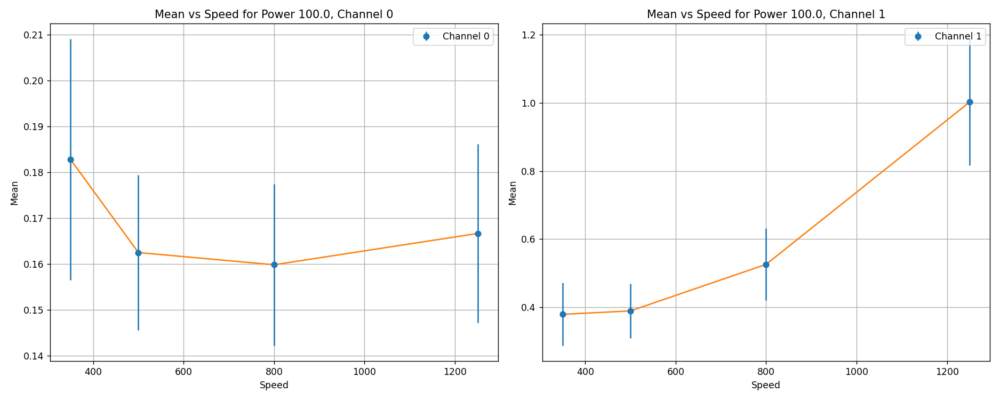

<IPython.core.display.Javascript object>


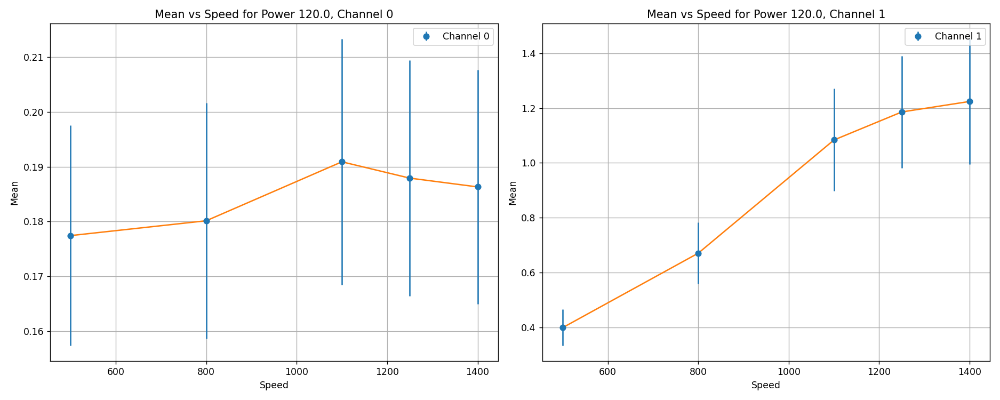

<IPython.core.display.Javascript object>


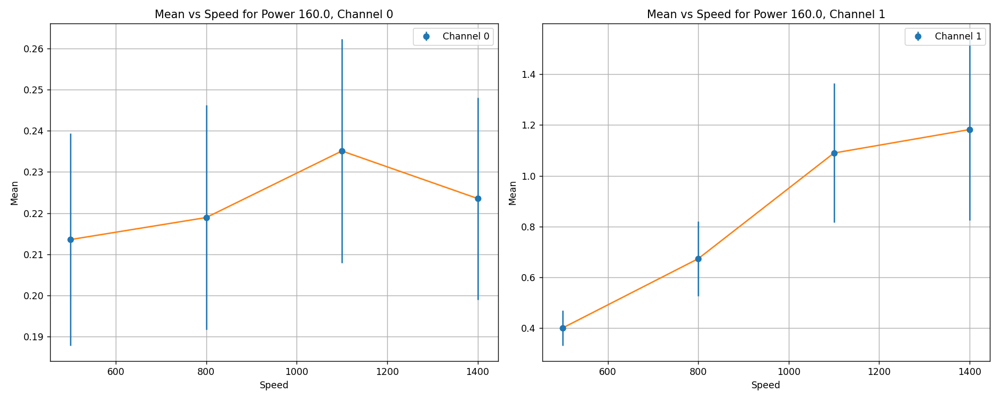

<IPython.core.display.Javascript object>


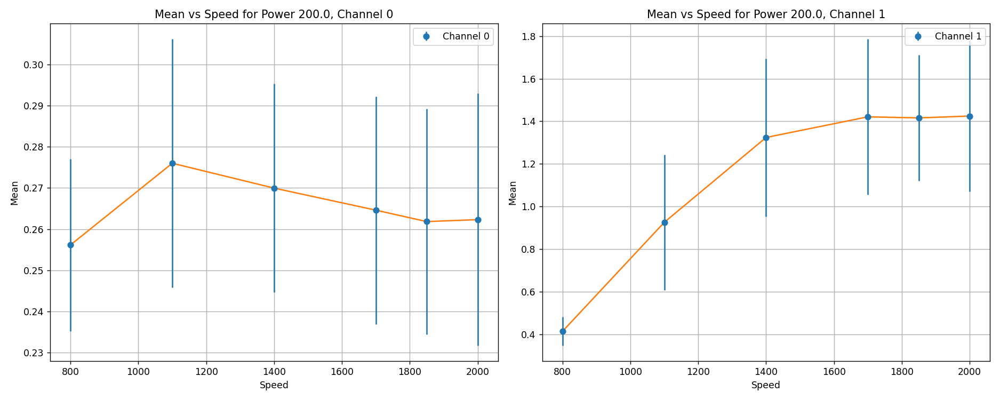

<IPython.core.display.Javascript object>


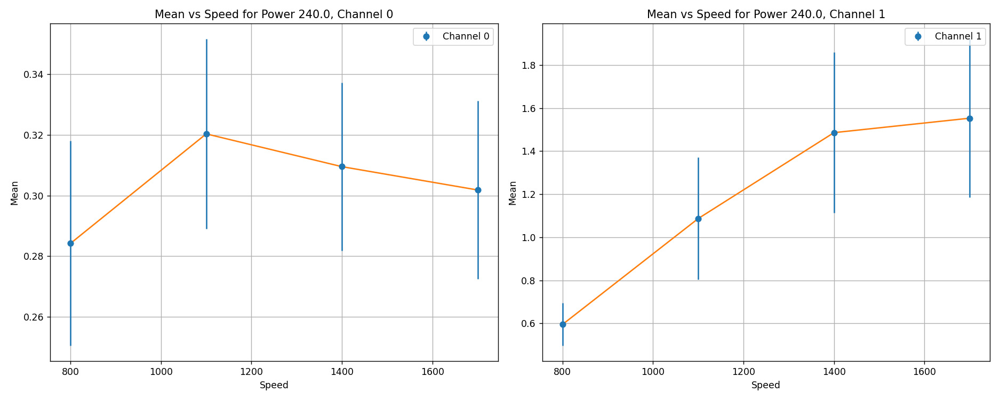

In [24]:
import matplotlib.pyplot as plt
import numpy as np
import math

# Unique power levels
unique_powers = np.unique([condition_data['info']['Power'] for condition_data in moments_dict.values()])

# Loop through unique power levels
for power in unique_powers:
    # Initialize data containers for the plots
    mean_data = {'channel_0': [], 'channel_1': []}
    std_data = {'channel_0': [], 'channel_1': []}
    speeds = []
    
    # Loop through each condition to gather data
    for condition_number, condition_data in moments_dict.items():
        if condition_data['info']['Power'] == power:
            speeds.append(condition_data['info']['Speed'])
            
            for channel in [0, 1]:
                # Mean is the first moment
                mean_value = condition_data[f'channel_{channel}']['moments'][0]
                # Std is the square root of the second moment (variance)
                std_value = math.sqrt(condition_data[f'channel_{channel}']['moments'][1])
                
                mean_data[f'channel_{channel}'].append(mean_value)
                std_data[f'channel_{channel}'].append(std_value)
    
    # Sort data by speed
    sorted_indices = np.argsort(speeds)
    speeds = np.array(speeds)[sorted_indices]
    
    for channel in [0, 1]:
        mean_data[f'channel_{channel}'] = np.array(mean_data[f'channel_{channel}'])[sorted_indices]
        std_data[f'channel_{channel}'] = np.array(std_data[f'channel_{channel}'])[sorted_indices]
    
    # Create the plots
    fig, axs = plt.subplots(1, 2, figsize=(15, 6))
    
    for channel in [0, 1]:
        # Plot error bars
        axs[channel].errorbar(speeds, mean_data[f'channel_{channel}'], yerr=std_data[f'channel_{channel}'], fmt='o', label=f'Channel {channel}')
        # Plot the line connecting the dots
        axs[channel].plot(speeds, mean_data[f'channel_{channel}'], linestyle='-', marker='')
        
        axs[channel].set_title(f'Mean vs Speed for Power {power}, Channel {channel}')
        axs[channel].set_xlabel('Speed')
        axs[channel].set_ylabel('Mean')
        axs[channel].legend()
        axs[channel].grid(True)
        
    plt.tight_layout()
    plt.show()


<IPython.core.display.Javascript object>


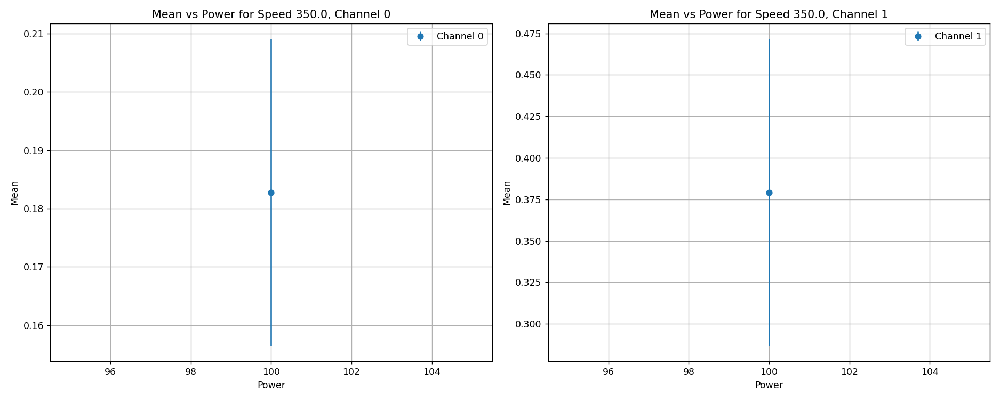

<IPython.core.display.Javascript object>


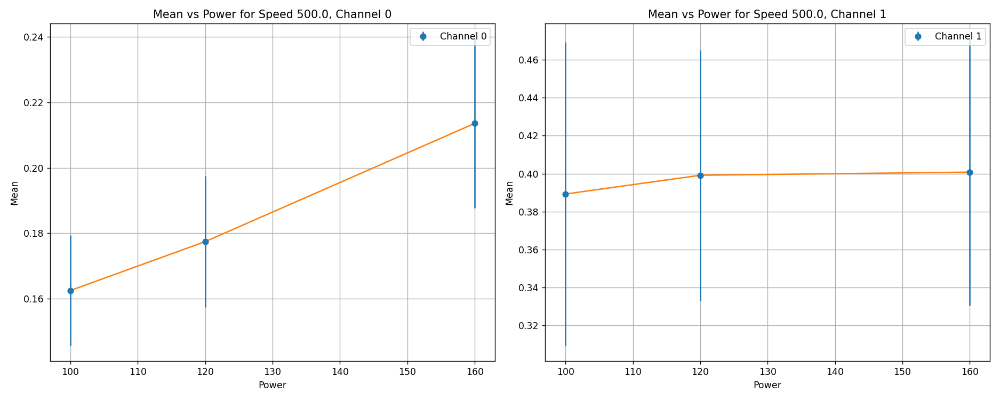

<IPython.core.display.Javascript object>


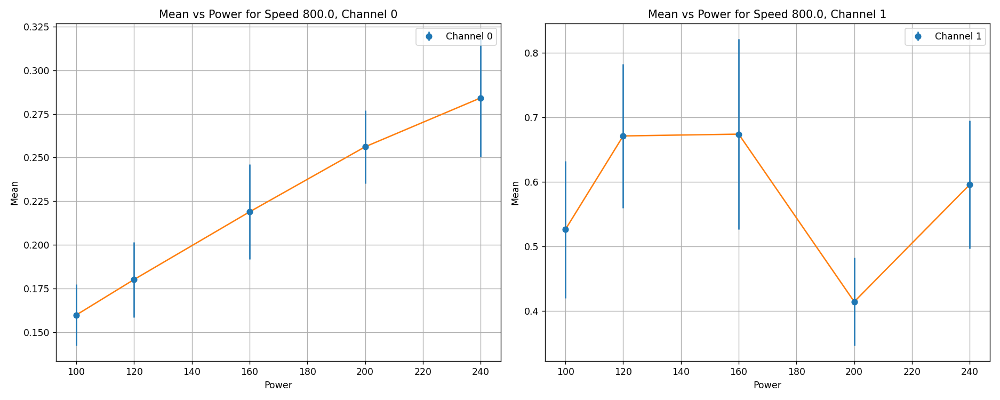

<IPython.core.display.Javascript object>


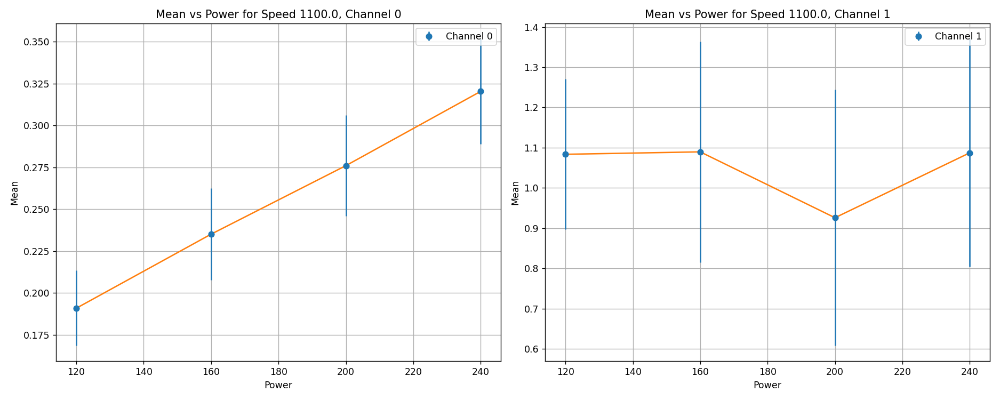

<IPython.core.display.Javascript object>


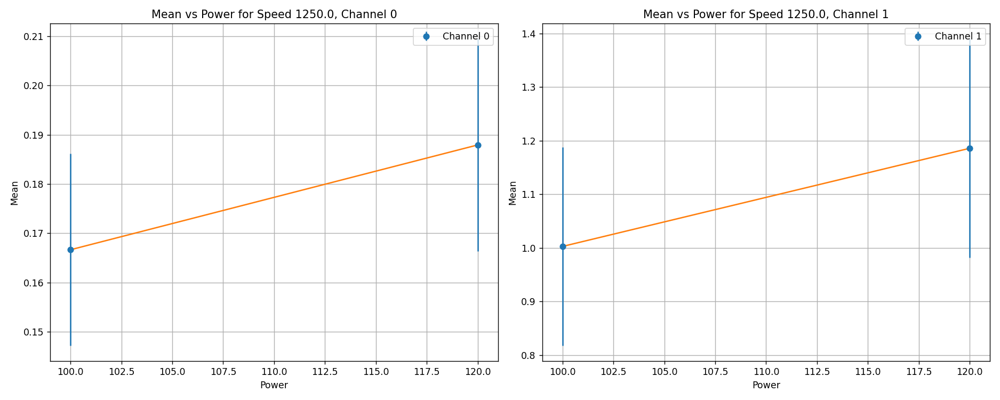

<IPython.core.display.Javascript object>


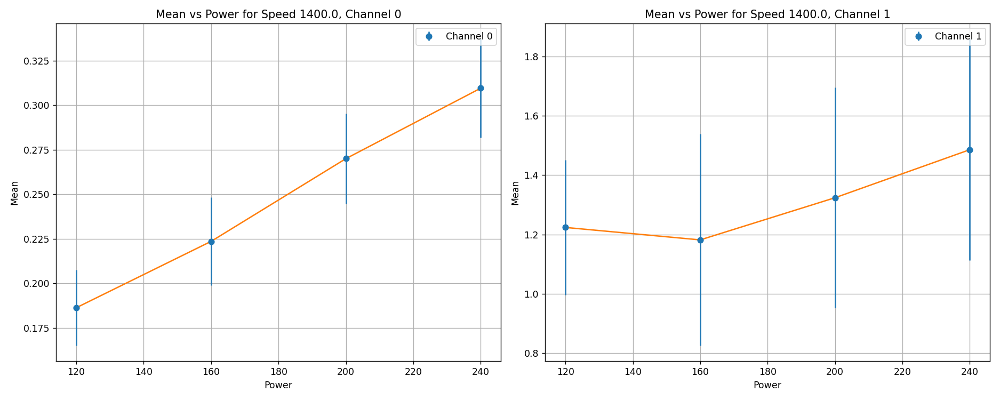

<IPython.core.display.Javascript object>


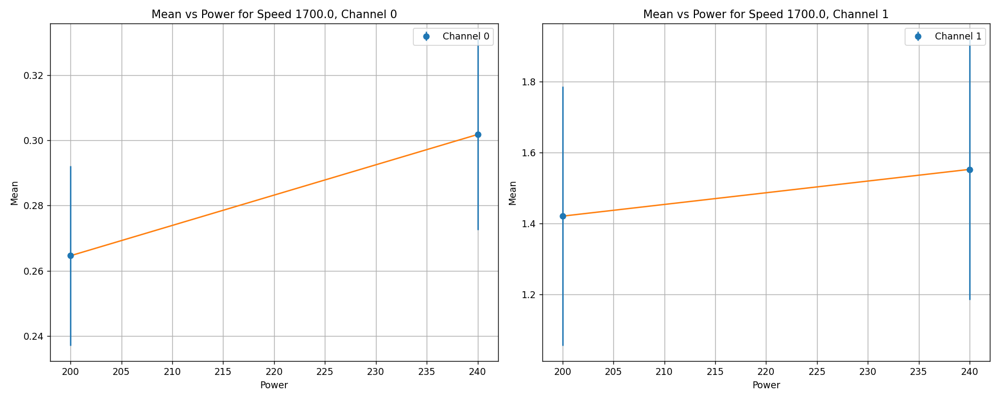

<IPython.core.display.Javascript object>


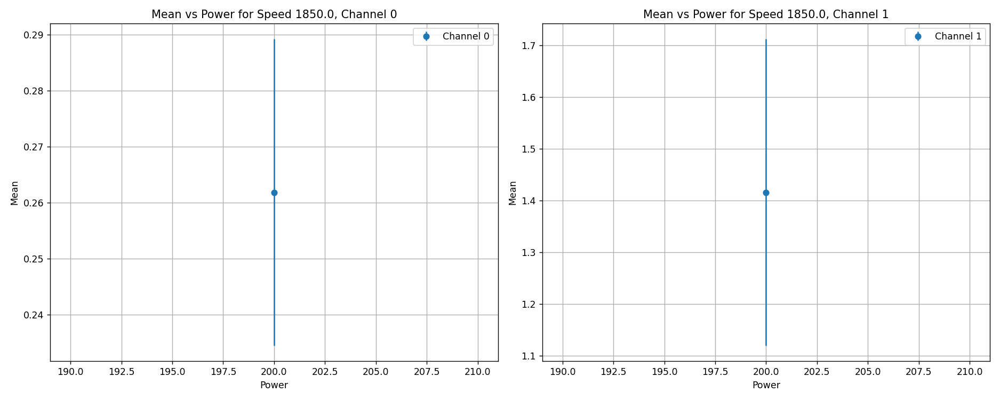

<IPython.core.display.Javascript object>


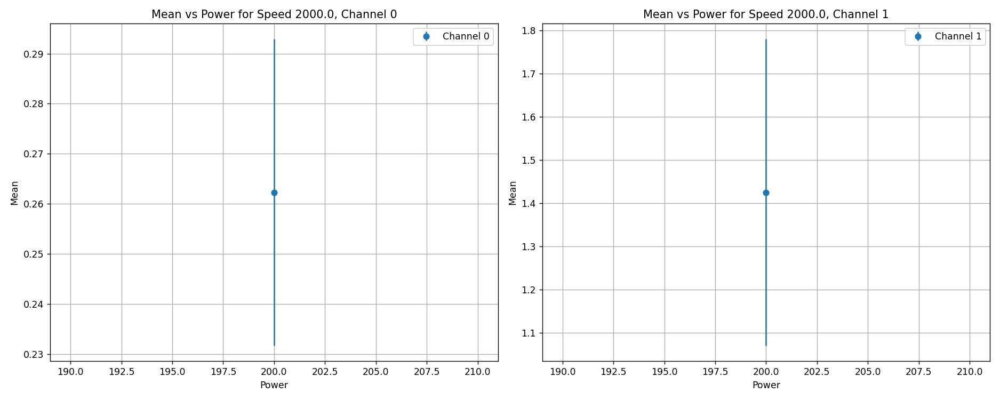

In [25]:
import matplotlib.pyplot as plt
import numpy as np
import math

# Unique speed levels
unique_speeds = np.unique([condition_data['info']['Speed'] for condition_data in moments_dict.values()])

# Loop through unique speed levels
for speed in unique_speeds:
    # Initialize data containers for the plots
    mean_data = {'channel_0': [], 'channel_1': []}
    std_data = {'channel_0': [], 'channel_1': []}
    powers = []
    
    # Loop through each condition to gather data
    for condition_number, condition_data in moments_dict.items():
        if condition_data['info']['Speed'] == speed:
            powers.append(condition_data['info']['Power'])
            
            for channel in [0, 1]:
                # Mean is the first moment
                mean_value = condition_data[f'channel_{channel}']['moments'][0]
                # Std is the square root of the second moment (variance)
                std_value = math.sqrt(condition_data[f'channel_{channel}']['moments'][1])
                
                mean_data[f'channel_{channel}'].append(mean_value)
                std_data[f'channel_{channel}'].append(std_value)
    
    # Sort data by power
    sorted_indices = np.argsort(powers)
    powers = np.array(powers)[sorted_indices]
    
    for channel in [0, 1]:
        mean_data[f'channel_{channel}'] = np.array(mean_data[f'channel_{channel}'])[sorted_indices]
        std_data[f'channel_{channel}'] = np.array(std_data[f'channel_{channel}'])[sorted_indices]
    
    # Create the plots
    fig, axs = plt.subplots(1, 2, figsize=(15, 6))
    
    for channel in [0, 1]:
        # Plot error bars
        axs[channel].errorbar(powers, mean_data[f'channel_{channel}'], yerr=std_data[f'channel_{channel}'], fmt='o', label=f'Channel {channel}')
        # Plot the line connecting the dots
        axs[channel].plot(powers, mean_data[f'channel_{channel}'], linestyle='-', marker='')
        
        axs[channel].set_title(f'Mean vs Power for Speed {speed}, Channel {channel}')
        axs[channel].set_xlabel('Power')
        axs[channel].set_ylabel('Mean')
        axs[channel].legend()
        axs[channel].grid(True)
        
    plt.tight_layout()
    plt.show()
